# Proyecto PIF Machine Learning 2
## Clasificacion automatica de enfermedades foliares en cultivos mediante Deep Learning sobre PlantVillage

**Version orientada a tesis:** carga local robusta, particion por hoja fisica (`leaf_id`), auditoria anti-fuga, entrenamiento optimizado y seleccion de modelo exclusivamente con validacion.


## 1. Librerías y paquetes

In [1]:
import importlib.util
import subprocess
import sys

# Solo se instalan dependencias realmente ausentes.
# Se elimina tensorflow-datasets para evitar el conflicto TFDS / tensorflow-metadata / protobuf
# que provocaba que tfds quedara importado de forma incompleta.
required_packages = {
    "tensorflow": "tensorflow",
    "sklearn": "scikit-learn",
    "pandas": "pandas",
    "matplotlib": "matplotlib",
    "PIL": "pillow",
    "tqdm": "tqdm"
}

for module_name, package_name in required_packages.items():
    if importlib.util.find_spec(module_name) is None:
        print(f"Instalando paquete faltante: {package_name}")
        subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", package_name])

print("Dependencias verificadas.")


Dependencias verificadas.


### Nota de compatibilidad

Esta versión ya **no reinstala TensorFlow ni usa `tensorflow-datasets`**. El error original se producía porque `tensorflow_metadata` había sido generado con una versión de Protobuf más reciente que el runtime instalado; TFDS quedaba parcialmente importado y posteriormente aparecía el mensaje engañoso `tensorflow_datasets has no attribute load`.

La carga de PlantVillage se realiza directamente desde la copia local del dataset oficial, lo que reduce dependencias, evita esa incompatibilidad y mejora la reproducibilidad del proyecto.


In [2]:
import math
import shutil
import random
import warnings
import platform
import re
import json
import time
import hashlib
import urllib.request
import urllib.error
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from tqdm.auto import tqdm
from IPython.display import display

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
    roc_curve,
    auc
)
from sklearn.preprocessing import label_binarize

warnings.filterwarnings("ignore")

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# Configuracion de GPU mas segura: evita reservar toda la VRAM al iniciar.
GPU_DEVICES = tf.config.list_physical_devices("GPU")
for gpu in GPU_DEVICES:
    try:
        tf.config.experimental.set_memory_growth(gpu, True)
    except Exception:
        pass

# Mixed precision acelera especialmente GPUs NVIDIA modernas y reduce consumo de VRAM.
# La capa de salida de todos los modelos se mantiene en float32.
MIXED_PRECISION_ACTIVE = False
if GPU_DEVICES:
    try:
        keras.mixed_precision.set_global_policy("mixed_float16")
        MIXED_PRECISION_ACTIVE = True
    except Exception as exc:
        print("No fue posible activar mixed precision:", exc)

print("Python:", platform.python_version())
print("TensorFlow:", tf.__version__)
print("GPU disponible:", GPU_DEVICES)
print("Politica numerica:", keras.mixed_precision.global_policy())


Python: 3.13.15
TensorFlow: 2.21.0
GPU disponible: []
Politica numerica: <DTypePolicy "float32">


## 2. Parametros del proyecto

In [3]:
PROJECT_NAME = "PIF_ML2_PlantVillage_OpcionB_Tesis_LeafID"

CLASS_PREFIXES = (
    "Tomato___",
    "Potato___",
    "Pepper,_bell___"
)

# -----------------------------------------------------------------------------
# RUTA DEL DATASET
# -----------------------------------------------------------------------------
# Puedes dejarla en None para deteccion automatica.
# Tambien puedes indicar:
#   1) la carpeta PlantVillage-Dataset,
#   2) la carpeta raw/color,
#   3) o el archivo .zip descargado.
#
# Ejemplo Windows:
# PLANTVILLAGE_PATH = Path(r"C:\Users\TU_USUARIO\Downloads\PlantVillage-Dataset")
#
# Ejemplo Colab:
# PLANTVILLAGE_PATH = Path("/content/PlantVillage-Dataset")
PLANTVILLAGE_PATH = None

# -----------------------------------------------------------------------------
# MODOS DE EJECUCION
# -----------------------------------------------------------------------------
# True: prueba rapida del pipeline. Selecciona hojas completas por clase.
# False: experimento final de tesis con todas las imagenes objetivo.
MODO_VALIDACION_RAPIDA = True
MAX_IMAGES_PER_CLASS = 700 if MODO_VALIDACION_RAPIDA else None

IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32

# Las proporciones se aplican a grupos leaf_id, no a imagenes individuales.
# Por eso los porcentajes finales de imagenes son aproximados.
TEST_SIZE = 0.15
VAL_SIZE = 0.15

EPOCHS_CNN = 15 if MODO_VALIDACION_RAPIDA else 30
EPOCHS_TL_HEAD = 10 if MODO_VALIDACION_RAPIDA else 20
EPOCHS_TL_FINE = 8 if MODO_VALIDACION_RAPIDA else 15
EPOCHS_EFF_HEAD = 8 if MODO_VALIDACION_RAPIDA else 18
EPOCHS_EFF_FINE = 6 if MODO_VALIDACION_RAPIDA else 12

LR_CNN = 1e-3
LR_TRANSFER_HEAD = 1e-3
LR_FINE_TUNING = 1e-5
LR_EFFICIENTNET_HEAD = 1e-3
LR_EFFICIENTNET_FINE = 1e-5

FINE_TUNE_LAST_N_LAYERS = 35
FINE_TUNE_EFFICIENTNET_LAST_N_LAYERS = 40

EARLY_STOPPING_PATIENCE = 4 if MODO_VALIDACION_RAPIDA else 6
REDUCE_LR_PATIENCE = 2 if MODO_VALIDACION_RAPIDA else 3

# Reduce overhead Python entre pasos de entrenamiento sin cambiar el modelo.
STEPS_PER_EXECUTION = 8

# Para acelerar la evaluacion, las matrices de confusion y ROC se generan solo en TEST.
# Las metricas y classification reports se conservan para Train, Validation y Test.
DETAILED_EVALUATION_SPLITS = ("Test",)

DATA_ROOT = Path("data")
EXTRACT_DIR = DATA_ROOT / "plantvillage_source"
METADATA_DIR = DATA_ROOT / "plantvillage_metadata"
OUTPUT_DIR = Path("outputs")
FIG_DIR = OUTPUT_DIR / "figures"
MODEL_DIR = OUTPUT_DIR / "models"
TABLE_DIR = OUTPUT_DIR / "tables"

for directory in [
    DATA_ROOT, EXTRACT_DIR, METADATA_DIR,
    OUTPUT_DIR, FIG_DIR, MODEL_DIR, TABLE_DIR
]:
    directory.mkdir(parents=True, exist_ok=True)

LEAF_MAP_URL = (
    "https://huggingface.co/datasets/mohanty/PlantVillage/"
    "resolve/main/leaf_grouping/leaf-map.json"
)


environment_info = pd.DataFrame([{
    "project": PROJECT_NAME,
    "python": platform.python_version(),
    "tensorflow": tf.__version__,
    "mixed_precision": str(MIXED_PRECISION_ACTIVE),
    "gpu_devices": str(GPU_DEVICES),
    "seed": SEED,
    "image_height": IMAGE_SIZE[0],
    "image_width": IMAGE_SIZE[1],
    "batch_size": BATCH_SIZE
}])
environment_info.to_csv(TABLE_DIR / "entorno_ejecucion.csv", index=False)

print("Configuracion cargada")
print("Modo validacion rapida:", MODO_VALIDACION_RAPIDA)
print("Maximo aproximado de imagenes por clase:", MAX_IMAGES_PER_CLASS)
print("Tamano de imagen:", IMAGE_SIZE)
print("Batch size:", BATCH_SIZE)
print("Split por leaf_id -> Train:", 1 - VAL_SIZE - TEST_SIZE,
      "Validation:", VAL_SIZE, "Test:", TEST_SIZE)
print("Steps per execution:", STEPS_PER_EXECUTION)
print("Mixed precision:", MIXED_PRECISION_ACTIVE)


Configuracion cargada
Modo validacion rapida: True
Maximo aproximado de imagenes por clase: 700
Tamano de imagen: (224, 224)
Batch size: 32
Split por leaf_id -> Train: 0.7 Validation: 0.15 Test: 0.15
Steps per execution: 8
Mixed precision: False


## 3. Carga local de PlantVillage corregida

La carga de imagenes sigue realizandose directamente desde la estructura local `raw/color` de PlantVillage y **no utiliza `tensorflow-datasets`**.

La version para tesis agrega una segunda pieza: el metadato oficial de agrupacion `leaf_id`. El cuaderno busca primero `leaf-map.json` dentro de la descarga local de PlantVillage. Si no existe, descarga unicamente ese archivo de metadatos y lo guarda en `data/plantvillage_metadata`.

Esto permite separar hojas fisicas completas entre Train, Validation y Test y evita que fotografias diferentes de una misma hoja aparezcan en particiones distintas.

Fuentes metodologicas:
- Repositorio oficial: `spMohanty/PlantVillage-Dataset`.
- Dataset oficial en Hugging Face: `mohanty/PlantVillage`.
- Mohanty, Hughes y Salathe (2016), *Using Deep Learning for Image-Based Plant Disease Detection*.


In [4]:
def _looks_like_color_directory(path: Path) -> bool:
    if not path.exists() or not path.is_dir():
        return False
    try:
        class_dirs = [p.name for p in path.iterdir() if p.is_dir()]
    except PermissionError:
        return False
    return any(name.startswith(CLASS_PREFIXES) for name in class_dirs)


def _candidate_color_directories(base: Path):
    """Genera rutas candidatas sin hacer búsquedas recursivas costosas."""
    base = base.expanduser()
    candidates = [
        base,
        base / "raw" / "color",
        base / "color",
        base / "PlantVillage-Dataset" / "raw" / "color",
        base / "PlantVillage_Dataset" / "raw" / "color",
    ]

    if base.exists() and base.is_dir():
        try:
            for child in base.iterdir():
                if child.is_dir():
                    candidates.extend([
                        child,
                        child / "raw" / "color",
                        child / "color",
                        child / "PlantVillage-Dataset" / "raw" / "color",
                    ])
        except PermissionError:
            pass

    seen = set()
    for candidate in candidates:
        try:
            key = str(candidate.resolve())
        except Exception:
            key = str(candidate)
        if key not in seen:
            seen.add(key)
            yield candidate


def _extract_zip_once(zip_path: Path, extract_dir: Path) -> Path:
    marker = extract_dir / ".plantvillage_extracted"
    zip_signature = str(zip_path.expanduser().resolve())

    marker_matches = (
        marker.exists() and
        marker.read_text(encoding="utf-8").strip() == zip_signature
    )

    if not marker_matches:
        print(f"Extrayendo dataset desde: {zip_path}")
        if extract_dir.exists():
            shutil.rmtree(extract_dir)
        extract_dir.mkdir(parents=True, exist_ok=True)
        shutil.unpack_archive(str(zip_path), str(extract_dir))
        marker.write_text(zip_signature, encoding="utf-8")
    else:
        print("El mismo ZIP ya habia sido extraido. Se reutiliza la extraccion existente.")

    return extract_dir


def resolve_plantvillage_color_dir(user_path=None) -> Path:
    # 1. Ruta indicada manualmente por el usuario.
    if user_path is not None:
        user_path = Path(user_path).expanduser()
        if not user_path.exists():
            raise FileNotFoundError(f"La ruta indicada no existe: {user_path}")

        if user_path.is_file() and user_path.suffix.lower() == ".zip":
            user_path = _extract_zip_once(user_path, EXTRACT_DIR)

        for candidate in _candidate_color_directories(user_path):
            if _looks_like_color_directory(candidate):
                return candidate.resolve()

        raise FileNotFoundError(
            "La ruta existe, pero no contiene la estructura esperada de PlantVillage. "
            "Debe apuntar a PlantVillage-Dataset, raw/color o al ZIP del dataset."
        )

    # 2. Detección automática en ubicaciones habituales.
    search_roots = [
        Path.cwd(),
        Path.cwd().parent,
        Path.home() / "Downloads",
        Path("/content"),
        Path("/kaggle/input"),
        Path("/mnt/data"),
    ]

    for root in search_roots:
        for candidate in _candidate_color_directories(root):
            if _looks_like_color_directory(candidate):
                return candidate.resolve()

    # 3. Como último recurso, busca ZIPs con nombre PlantVillage en raíces conocidas.
    for root in search_roots:
        if root.exists() and root.is_dir():
            try:
                zip_candidates = sorted(root.glob("*PlantVillage*.zip")) + sorted(root.glob("*plantvillage*.zip"))
            except PermissionError:
                zip_candidates = []
            if zip_candidates:
                extracted_root = _extract_zip_once(zip_candidates[0], EXTRACT_DIR)
                for candidate in _candidate_color_directories(extracted_root):
                    if _looks_like_color_directory(candidate):
                        return candidate.resolve()

    raise FileNotFoundError(
        "No se encontró PlantVillage automáticamente. Edita PLANTVILLAGE_PATH en la sección 2 "
        "y asigna la ruta a la carpeta PlantVillage-Dataset, a raw/color o al archivo ZIP descargado."
    )


DATASET_COLOR_DIR = resolve_plantvillage_color_dir(PLANTVILLAGE_PATH)

print("PlantVillage localizado correctamente en:")
print(DATASET_COLOR_DIR)
print("No se usa tensorflow-datasets y no se copian imágenes a otra carpeta.")


Extrayendo dataset desde: d:\DataScience\proyecto Main\PlantVillage-Dataset-master.zip
PlantVillage localizado correctamente en:
D:\DataScience\proyecto Main\data\plantvillage_source\PlantVillage-Dataset-master\raw\color
No se usa tensorflow-datasets y no se copian imágenes a otra carpeta.


## 4. Construccion del catalogo de imagenes

Primero se indexan **todas** las imagenes de tomate, papa y pimiento. La reduccion del modo rapido se realiza mas adelante por grupos completos de `leaf_id`, no por imagenes individuales. De esa forma el modo de depuracion conserva la misma regla anti-fuga que el experimento final.


In [5]:
def build_dataframe_from_directory(dataset_dir: Path, class_prefixes: tuple):
    valid_extensions = {".jpg", ".jpeg", ".png"}
    records = []

    selected_class_dirs = sorted([
        p for p in dataset_dir.iterdir()
        if p.is_dir() and p.name.startswith(class_prefixes)
    ])

    if not selected_class_dirs:
        raise ValueError(
            "No se encontraron las clases objetivo. Revisa DATASET_COLOR_DIR y CLASS_PREFIXES."
        )

    print(f"Clases seleccionadas: {len(selected_class_dirs)}")

    for class_dir in tqdm(selected_class_dirs, desc="Indexando clases"):
        image_paths = sorted([
            p for p in class_dir.iterdir()
            if p.is_file() and p.suffix.lower() in valid_extensions
        ])

        records.extend({
            "filepath": str(image_path),
            "filename": image_path.name,
            "class_name": class_dir.name,
            "relative_path": f"raw/color/{class_dir.name}/{image_path.name}"
        } for image_path in image_paths)

    df = pd.DataFrame.from_records(records)
    if df.empty:
        raise ValueError("No se encontraron imagenes compatibles en las clases seleccionadas.")

    class_names = sorted(df["class_name"].unique())
    class_to_idx = {name: idx for idx, name in enumerate(class_names)}
    idx_to_class = {idx: name for name, idx in class_to_idx.items()}
    df["label"] = df["class_name"].map(class_to_idx).astype(np.int32)

    return df, class_names, class_to_idx, idx_to_class


df_catalog, class_names, class_to_idx, idx_to_class = build_dataframe_from_directory(
    dataset_dir=DATASET_COLOR_DIR,
    class_prefixes=CLASS_PREFIXES
)

NUM_CLASSES = len(class_names)

with open(TABLE_DIR / "class_mapping.json", "w", encoding="utf-8") as f:
    json.dump(
        {
            "class_names": class_names,
            "class_to_idx": class_to_idx
        },
        f,
        ensure_ascii=False,
        indent=2
    )

print("Total de imagenes objetivo encontradas:", f"{len(df_catalog):,}")
print("Numero de clases:", NUM_CLASSES)
print("Clases:")
for idx, name in enumerate(class_names):
    print(f"{idx:02d} -> {name}")

source_class_distribution = (
    df_catalog["class_name"]
    .value_counts()
    .sort_index()
    .rename("n_imagenes")
    .to_frame()
)
source_class_distribution.to_csv(TABLE_DIR / "distribucion_clases_fuente.csv")
source_class_distribution


Clases seleccionadas: 15


Indexando clases:   0%|          | 0/15 [00:00<?, ?it/s]

Total de imagenes objetivo encontradas: 22,787
Numero de clases: 15
Clases:
00 -> Pepper,_bell___Bacterial_spot
01 -> Pepper,_bell___healthy
02 -> Potato___Early_blight
03 -> Potato___Late_blight
04 -> Potato___healthy
05 -> Tomato___Bacterial_spot
06 -> Tomato___Early_blight
07 -> Tomato___Late_blight
08 -> Tomato___Leaf_Mold
09 -> Tomato___Septoria_leaf_spot
10 -> Tomato___Spider_mites Two-spotted_spider_mite
11 -> Tomato___Target_Spot
12 -> Tomato___Tomato_Yellow_Leaf_Curl_Virus
13 -> Tomato___Tomato_mosaic_virus
14 -> Tomato___healthy


,n_imagenes
class_name,
"Pepper,_bell___Bacterial_spot",997
"Pepper,_bell___healthy",1478
Potato___Early_blight,1000
Potato___Late_blight,1000
Potato___healthy,152
Tomato___Bacterial_spot,2127
Tomato___Early_blight,1000
Tomato___Late_blight,1909
Tomato___Leaf_Mold,952


## 5. Particion Train / Validation / Test por `leaf_id`

Esta version elimina la division aleatoria por imagen.

La unidad de particion es la **hoja fisica** (`leaf_id`). Para cada clase se distribuyen grupos completos de hojas aproximadamente en 70% Train, 15% Validation y 15% Test. Una vez asignada una hoja a una particion, **todas sus fotografias permanecen en esa misma particion**.

La estratificacion se hace por clase a nivel de hojas. Al final se ejecuta una auditoria automatica que detiene el cuaderno si detecta algun `leaf_id` compartido entre particiones.

> Nota metodologica: cuando PlantVillage no ofrece un `leaf_id` real para una imagen, se utiliza el mismo criterio de identificador alternativo empleado por el cargador oficial. El porcentaje de registros con metadato oficial y con fallback queda cuantificado y exportado.


In [6]:
def _dataset_root_from_color_dir(color_dir: Path) -> Path:
    color_dir = Path(color_dir).resolve()
    if color_dir.name.lower() == "color" and color_dir.parent.name.lower() == "raw":
        return color_dir.parent.parent
    return color_dir


def _download_file(url: str, destination: Path, timeout: int = 60) -> Path:
    destination.parent.mkdir(parents=True, exist_ok=True)

    request = urllib.request.Request(
        url,
        headers={"User-Agent": "Mozilla/5.0"}
    )

    try:
        with urllib.request.urlopen(request, timeout=timeout) as response:
            with open(destination, "wb") as output_file:
                shutil.copyfileobj(response, output_file)
    except Exception as exc:
        raise RuntimeError(
            "No fue posible obtener leaf-map.json automaticamente. "
            "Si tu descarga local de PlantVillage no lo incluye, descarga el archivo "
            "leaf_grouping/leaf-map.json del dataset oficial mohanty/PlantVillage "
            f"y guardalo en: {destination}"
        ) from exc

    return destination


def resolve_leaf_map_path(color_dir: Path) -> Path:
    dataset_root = _dataset_root_from_color_dir(color_dir)

    candidates = [
        dataset_root / "leaf-map.json",
        dataset_root / "leaf_grouping" / "leaf-map.json",
        METADATA_DIR / "leaf-map.json",
    ]

    for candidate in candidates:
        if candidate.exists() and candidate.is_file() and candidate.stat().st_size > 0:
            print("Leaf map encontrado:", candidate.resolve())
            return candidate.resolve()

    destination = METADATA_DIR / "leaf-map.json"
    print("No se encontro leaf-map.json local. Descargando solo el metadato oficial...")
    return _download_file(LEAF_MAP_URL, destination).resolve()


def normalize_image_identifier(filename: str) -> str:
    image_identifier = filename.replace("_final_masked", "")

    if "___" in image_identifier:
        image_identifier = image_identifier.split("___")[-1]

    image_identifier = image_identifier.split("copy")[0]
    image_identifier = re.sub(
        r"\.(jpg|jpeg|png)$",
        "",
        image_identifier,
        flags=re.IGNORECASE
    )
    return image_identifier.strip()


def assign_leaf_metadata(df: pd.DataFrame, leaf_map_path: Path) -> pd.DataFrame:
    with open(leaf_map_path, "r", encoding="utf-8") as f:
        leaf_map = json.load(f)

    records = []

    for row in tqdm(df.itertuples(index=False), total=len(df), desc="Asignando leaf_id"):
        identifier = normalize_image_identifier(row.filename)
        lookup_key = identifier.lower().strip()
        suggestions = leaf_map.get(lookup_key, [])

        leaf_id = None
        leaf_id_source = "fallback_identifier"

        if len(suggestions) == 1:
            leaf_id = suggestions[0]
            leaf_id_source = "official_leaf_map"

        elif len(suggestions) > 1:
            matching = [
                suggestion
                for suggestion in suggestions
                if row.class_name in suggestion
            ]
            if matching:
                leaf_id = matching[0]
                leaf_id_source = "official_leaf_map"

        if leaf_id is None:
            # Prefijo de clase para impedir una colision accidental entre clases.
            leaf_id = f"fallback::{row.class_name}::{identifier}"

        records.append((leaf_id, leaf_id_source))

    result = df.copy()
    result["leaf_id"] = [x[0] for x in records]
    result["leaf_id_source"] = [x[1] for x in records]
    return result


def cap_by_complete_leaf_groups(
    df: pd.DataFrame,
    max_images_per_class,
    seed: int = 42
) -> pd.DataFrame:
    if max_images_per_class is None:
        return df.copy().reset_index(drop=True)

    selected_parts = []

    for class_idx, class_name in enumerate(sorted(df["class_name"].unique())):
        class_df = df[df["class_name"] == class_name].copy()

        if len(class_df) <= max_images_per_class:
            selected_parts.append(class_df)
            continue

        group_sizes = (
            class_df.groupby("leaf_id")
            .size()
            .rename("n_images")
            .reset_index()
        )

        rng = np.random.default_rng(seed + class_idx)
        shuffled_leaf_ids = group_sizes["leaf_id"].to_numpy().copy()
        rng.shuffle(shuffled_leaf_ids)

        group_size_map = dict(
            zip(group_sizes["leaf_id"], group_sizes["n_images"])
        )

        selected_leaf_ids = []
        current_n = 0

        for leaf_id in shuffled_leaf_ids:
            group_n = int(group_size_map[leaf_id])

            # Incluye grupos completos y se detiene cerca del objetivo.
            if selected_leaf_ids and current_n >= max_images_per_class:
                break

            selected_leaf_ids.append(leaf_id)
            current_n += group_n

        selected_parts.append(
            class_df[class_df["leaf_id"].isin(selected_leaf_ids)]
        )

    sampled = pd.concat(selected_parts, ignore_index=True)
    return sampled.sample(frac=1.0, random_state=seed).reset_index(drop=True)


def leaf_grouped_stratified_split(
    df: pd.DataFrame,
    val_size: float = 0.15,
    test_size: float = 0.15,
    seed: int = 42
):
    if val_size <= 0 or test_size <= 0 or (val_size + test_size) >= 1:
        raise ValueError("VAL_SIZE y TEST_SIZE deben ser positivos y sumar menos de 1.")

    leaf_class_counts = df.groupby("leaf_id")["class_name"].nunique()
    cross_class_leaf_ids = leaf_class_counts[leaf_class_counts > 1]

    if len(cross_class_leaf_ids) > 0:
        raise RuntimeError(
            "Se detectaron leaf_id asociados a mas de una clase. "
            "La particion se detiene para evitar contaminacion entre clases."
        )

    split_by_leaf = {}

    for class_idx, class_name in enumerate(sorted(df["class_name"].unique())):
        class_df = df[df["class_name"] == class_name]

        leaf_table = (
            class_df.groupby("leaf_id")
            .size()
            .rename("n_images")
            .reset_index()
        )

        n_leaves = len(leaf_table)
        if n_leaves < 3:
            raise ValueError(
                f"La clase {class_name} solo tiene {n_leaves} leaf_id. "
                "Se necesitan al menos 3 para Train/Validation/Test."
            )

        rng = np.random.default_rng(seed + class_idx)
        leaf_ids = leaf_table["leaf_id"].to_numpy().copy()
        rng.shuffle(leaf_ids)

        n_test = max(1, int(round(n_leaves * test_size)))
        n_val = max(1, int(round(n_leaves * val_size)))

        # Garantiza por lo menos una hoja en Train.
        if n_test + n_val >= n_leaves:
            excess = n_test + n_val - (n_leaves - 1)
            while excess > 0 and n_test > 1:
                n_test -= 1
                excess -= 1
            while excess > 0 and n_val > 1:
                n_val -= 1
                excess -= 1

        test_leaf_ids = set(leaf_ids[:n_test])
        val_leaf_ids = set(leaf_ids[n_test:n_test + n_val])
        train_leaf_ids = set(leaf_ids[n_test + n_val:])

        for leaf_id in train_leaf_ids:
            split_by_leaf[leaf_id] = "Train"
        for leaf_id in val_leaf_ids:
            split_by_leaf[leaf_id] = "Validation"
        for leaf_id in test_leaf_ids:
            split_by_leaf[leaf_id] = "Test"

    result = df.copy()
    result["split"] = result["leaf_id"].map(split_by_leaf)

    if result["split"].isna().any():
        raise RuntimeError("Existen imagenes sin particion despues del split por leaf_id.")

    df_train = result[result["split"] == "Train"].drop(columns="split").reset_index(drop=True)
    df_val = result[result["split"] == "Validation"].drop(columns="split").reset_index(drop=True)
    df_test = result[result["split"] == "Test"].drop(columns="split").reset_index(drop=True)

    return df_train, df_val, df_test


def audit_leaf_leakage(df_train, df_val, df_test):
    leaf_train = set(df_train["leaf_id"])
    leaf_val = set(df_val["leaf_id"])
    leaf_test = set(df_test["leaf_id"])

    audit = pd.DataFrame([
        {
            "comparison": "Train vs Validation",
            "shared_leaf_ids": len(leaf_train & leaf_val)
        },
        {
            "comparison": "Train vs Test",
            "shared_leaf_ids": len(leaf_train & leaf_test)
        },
        {
            "comparison": "Validation vs Test",
            "shared_leaf_ids": len(leaf_val & leaf_test)
        }
    ])

    if audit["shared_leaf_ids"].sum() != 0:
        raise RuntimeError(
            "Se detecto fuga de informacion: existen leaf_id compartidos entre particiones."
        )

    return audit


LEAF_MAP_PATH = resolve_leaf_map_path(DATASET_COLOR_DIR)
df_with_leaf = assign_leaf_metadata(df_catalog, LEAF_MAP_PATH)

leaf_metadata_coverage = (
    df_with_leaf["leaf_id_source"]
    .value_counts()
    .rename_axis("leaf_id_source")
    .reset_index(name="n_images")
)
leaf_metadata_coverage["percentage"] = (
    leaf_metadata_coverage["n_images"] / len(df_with_leaf)
)
leaf_metadata_coverage.to_csv(
    TABLE_DIR / "cobertura_metadatos_leaf_id.csv",
    index=False
)

leaf_metadata_coverage_by_class = (
    df_with_leaf
    .groupby(["class_name", "leaf_id_source"])
    .size()
    .rename("n_images")
    .reset_index()
)
leaf_metadata_coverage_by_class["percentage_within_class"] = (
    leaf_metadata_coverage_by_class["n_images"] /
    leaf_metadata_coverage_by_class.groupby("class_name")["n_images"].transform("sum")
)
leaf_metadata_coverage_by_class.to_csv(
    TABLE_DIR / "cobertura_metadatos_leaf_id_por_clase.csv",
    index=False
)

df_working = cap_by_complete_leaf_groups(
    df_with_leaf,
    max_images_per_class=MAX_IMAGES_PER_CLASS,
    seed=SEED
)

df_train, df_val, df_test = leaf_grouped_stratified_split(
    df_working,
    val_size=VAL_SIZE,
    test_size=TEST_SIZE,
    seed=SEED
)

leaf_leakage_audit = audit_leaf_leakage(df_train, df_val, df_test)
leaf_leakage_audit.to_csv(
    TABLE_DIR / "auditoria_fuga_leaf_id.csv",
    index=False
)

df_all = pd.concat([
    df_train.assign(split="Train"),
    df_val.assign(split="Validation"),
    df_test.assign(split="Test")
], ignore_index=True)

# Fingerprint reproducible del conjunto de trabajo y su particion.
fingerprint_source = "\n".join(
    (
        df_all[["relative_path", "leaf_id", "split"]]
        .sort_values(["relative_path", "leaf_id", "split"])
        .astype(str)
        .agg("|".join, axis=1)
        .tolist()
    )
)
DATASET_SPLIT_SHA256 = hashlib.sha256(
    fingerprint_source.encode("utf-8")
).hexdigest()

df_all.to_csv(
    TABLE_DIR / "asignacion_imagenes_leaf_id_splits.csv",
    index=False
)

split_summary = pd.DataFrame({
    "split": ["Train", "Validation", "Test", "Total"],
    "n_imagenes": [len(df_train), len(df_val), len(df_test), len(df_all)],
    "n_leaf_id": [
        df_train["leaf_id"].nunique(),
        df_val["leaf_id"].nunique(),
        df_test["leaf_id"].nunique(),
        df_all["leaf_id"].nunique()
    ],
    "porcentaje_imagenes": [
        len(df_train) / len(df_all),
        len(df_val) / len(df_all),
        len(df_test) / len(df_all),
        1.0
    ]
})

split_summary.to_csv(TABLE_DIR / "resumen_splits_leaf_id.csv", index=False)

print("Cobertura global de metadatos leaf_id:")
display(leaf_metadata_coverage)

print("Cobertura de metadatos leaf_id por clase:")
display(leaf_metadata_coverage_by_class)

print("Auditoria anti-fuga:")
display(leaf_leakage_audit)

print("Resumen de particiones:")
display(split_summary)

print("SHA256 de la particion:", DATASET_SPLIT_SHA256)
print("Fuga de leaf_id detectada: NO")


Leaf map encontrado: D:\DataScience\proyecto Main\data\plantvillage_source\PlantVillage-Dataset-master\leaf-map.json


Asignando leaf_id:   0%|          | 0/22787 [00:00<?, ?it/s]

Cobertura global de metadatos leaf_id:


,leaf_id_source,n_images,percentage
0,official_leaf_map,16036,0.703735
1,fallback_identifier,6751,0.296265


Cobertura de metadatos leaf_id por clase:


,class_name,leaf_id_source,n_images,percentage_within_class
0,"Pepper,_bell___Bacterial_spot",official_leaf_map,997,1.000000
1,"Pepper,_bell___healthy",fallback_identifier,2,0.001353
2,"Pepper,_bell___healthy",official_leaf_map,1476,0.998647
3,Potato___Early_blight,official_leaf_map,1000,1.000000
4,Potato___Late_blight,official_leaf_map,1000,1.000000
5,Potato___healthy,official_leaf_map,152,1.000000
6,Tomato___Bacterial_spot,official_leaf_map,2127,1.000000
7,Tomato___Early_blight,fallback_identifier,1,0.001000
8,Tomato___Early_blight,official_leaf_map,999,0.999000
9,Tomato___Late_blight,fallback_identifier,989,0.518072


Auditoria anti-fuga:


,comparison,shared_leaf_ids
0,Train vs Validation,0
1,Train vs Test,0
2,Validation vs Test,0


Resumen de particiones:


,split,n_imagenes,n_leaf_id,porcentaje_imagenes
0,Train,6725,2805,0.698049
1,Validation,1465,600,0.152066
2,Test,1444,600,0.149886
3,Total,9634,4005,1.000000


SHA256 de la particion: 56bf9f7c19bbc8971a8f3fb6152ad3c4d4fd2e6c19936ca083d6e417e267c3b8
Fuga de leaf_id detectada: NO


## 6. Distribucion por clases y por particion

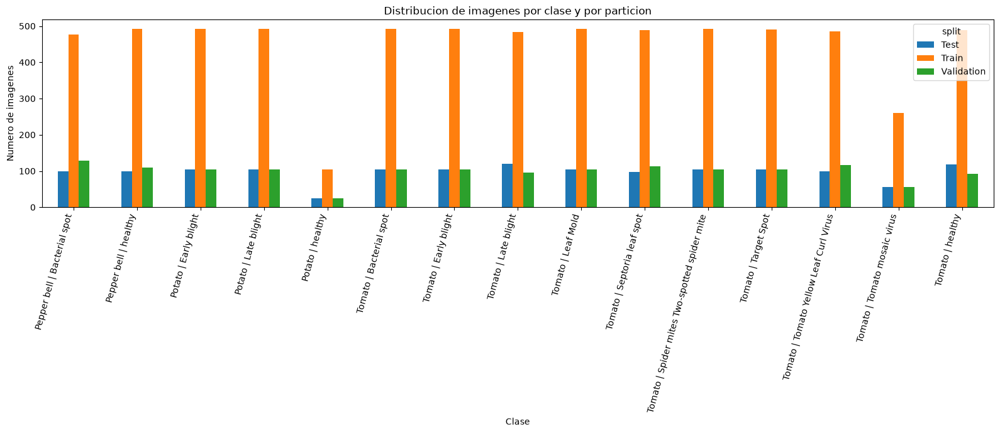

split,Test,Train,Validation
class_name,,,
"Pepper,_bell___Bacterial_spot",100,477,129
"Pepper,_bell___healthy",99,493,110
Potato___Early_blight,104,492,104
Potato___Late_blight,104,492,104
Potato___healthy,24,104,24
Tomato___Bacterial_spot,104,492,104
Tomato___Early_blight,104,492,104
Tomato___Late_blight,120,484,96
Tomato___Leaf_Mold,104,492,104


In [7]:
def clean_class_label(name: str) -> str:
    return (
        name.replace("___", " | ")
            .replace("_", " ")
            .replace("Pepper, bell", "Pepper bell")
    )

short_class_names = [clean_class_label(name) for name in class_names]

split_counts = []
for split_name, split_df in [
    ("Train", df_train),
    ("Validation", df_val),
    ("Test", df_test)
]:
    counts = (
        split_df["class_name"]
        .value_counts()
        .reindex(class_names)
        .fillna(0)
        .astype(int)
    )

    leaf_counts = (
        split_df.groupby("class_name")["leaf_id"]
        .nunique()
        .reindex(class_names)
        .fillna(0)
        .astype(int)
    )

    for class_name in class_names:
        split_counts.append({
            "split": split_name,
            "class_name": class_name,
            "n_images": int(counts[class_name]),
            "n_leaf_id": int(leaf_counts[class_name])
        })

split_counts_df = pd.DataFrame(split_counts)
split_counts_df.to_csv(
    TABLE_DIR / "distribucion_clases_por_split_leaf_id.csv",
    index=False
)

pivot_counts = (
    split_counts_df
    .pivot(index="class_name", columns="split", values="n_images")
    .reindex(class_names)
)

pivot_counts.plot(kind="bar", figsize=(16, 7))
plt.title("Distribucion de imagenes por clase y por particion")
plt.xlabel("Clase")
plt.ylabel("Numero de imagenes")
plt.xticks(
    ticks=range(len(class_names)),
    labels=short_class_names,
    rotation=75,
    ha="right"
)
plt.tight_layout()
plt.savefig(
    FIG_DIR / "distribucion_clases_por_split.png",
    dpi=300,
    bbox_inches="tight"
)
plt.show()

pivot_counts


## 7. Muestras del dataset

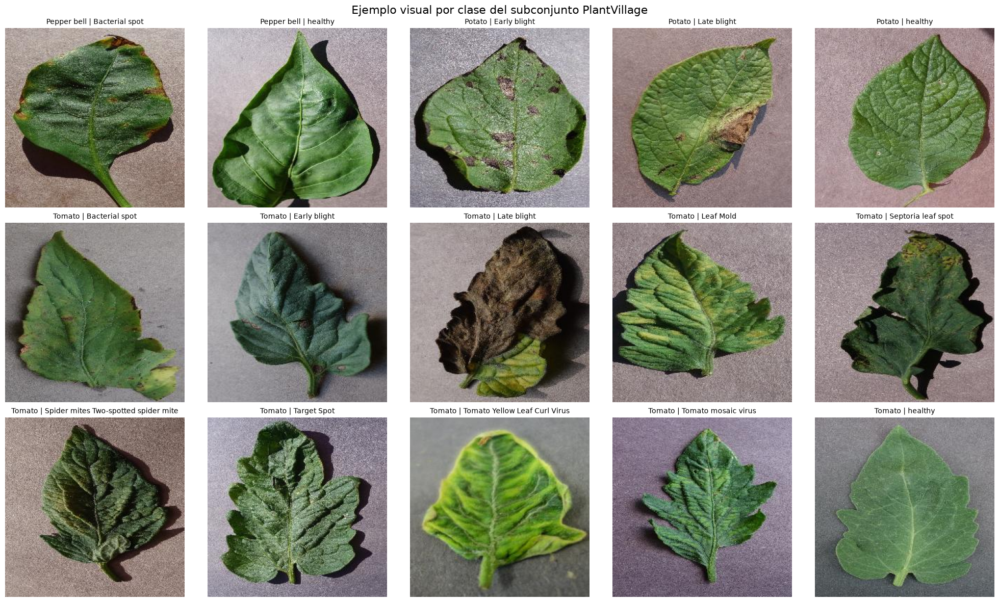

In [8]:
def plot_samples_per_class(df, class_names, n_cols=5, seed=42, savepath=None):
    random.seed(seed)
    n_classes = len(class_names)
    n_rows = math.ceil(n_classes / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
    axes = np.array(axes).reshape(-1)

    for i, class_name in enumerate(class_names):
        sample_path = df[df["class_name"] == class_name].sample(1, random_state=seed)["filepath"].iloc[0]
        img = Image.open(sample_path).convert("RGB")
        axes[i].imshow(img)
        axes[i].set_title(clean_class_label(class_name), fontsize=10)
        axes[i].axis("off")

    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.suptitle("Ejemplo visual por clase del subconjunto PlantVillage", fontsize=16)
    plt.tight_layout()
    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches="tight")
    plt.show()

plot_samples_per_class(
    df_all,
    class_names,
    n_cols=5,
    seed=SEED,
    savepath=FIG_DIR / "muestras_por_clase.png"
)

## 8. Pipeline `tf.data` optimizado

In [9]:
AUTOTUNE = tf.data.AUTOTUNE

ALL_IMAGES_ARE_JPEG = (
    df_all["filepath"]
    .str.lower()
    .str.endswith((".jpg", ".jpeg"))
    .all()
)

print("Todas las imagenes son JPEG:", ALL_IMAGES_ARE_JPEG)


def decode_image_from_path(filepath, label):
    image_bytes = tf.io.read_file(filepath)

    if ALL_IMAGES_ARE_JPEG:
        image = tf.io.decode_jpeg(
            image_bytes,
            channels=3,
            dct_method="INTEGER_FAST"
        )
    else:
        image = tf.io.decode_image(
            image_bytes,
            channels=3,
            expand_animations=False
        )
        image.set_shape([None, None, 3])

    image = tf.image.resize(
        image,
        IMAGE_SIZE,
        method=tf.image.ResizeMethod.BILINEAR,
        antialias=False
    )
    image = tf.cast(image, tf.float32)
    return image, label


def make_dataset(df, batch_size=32, shuffle=False, seed=42):
    paths = df["filepath"].to_numpy(dtype=str)
    labels = df["label"].to_numpy(dtype=np.int32)

    ds = tf.data.Dataset.from_tensor_slices((paths, labels))

    options = tf.data.Options()
    # Train prioriza throughput; validacion y test permanecen deterministas.
    options.experimental_deterministic = not shuffle
    ds = ds.with_options(options)

    if shuffle:
        ds = ds.shuffle(
            buffer_size=min(len(df), 8192),
            seed=seed,
            reshuffle_each_iteration=True
        )

    ds = ds.map(
        decode_image_from_path,
        num_parallel_calls=AUTOTUNE,
        deterministic=not shuffle
    )

    ds = ds.batch(batch_size, drop_remainder=False)
    ds = ds.prefetch(AUTOTUNE)
    return ds


train_ds = make_dataset(
    df_train,
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=SEED
)
val_ds = make_dataset(
    df_val,
    batch_size=BATCH_SIZE,
    shuffle=False,
    seed=SEED
)
test_ds = make_dataset(
    df_test,
    batch_size=BATCH_SIZE,
    shuffle=False,
    seed=SEED
)

for images, labels in train_ds.take(1):
    print("Batch imagenes:", images.shape)
    print("Batch etiquetas:", labels.shape)
    print(
        "Rango de pixeles:",
        float(tf.reduce_min(images)),
        float(tf.reduce_max(images))
    )


Todas las imagenes son JPEG: True
Batch imagenes: (32, 224, 224, 3)
Batch etiquetas: (32,)
Rango de pixeles: 0.0 254.17860412597656


## 9. Data augmentation

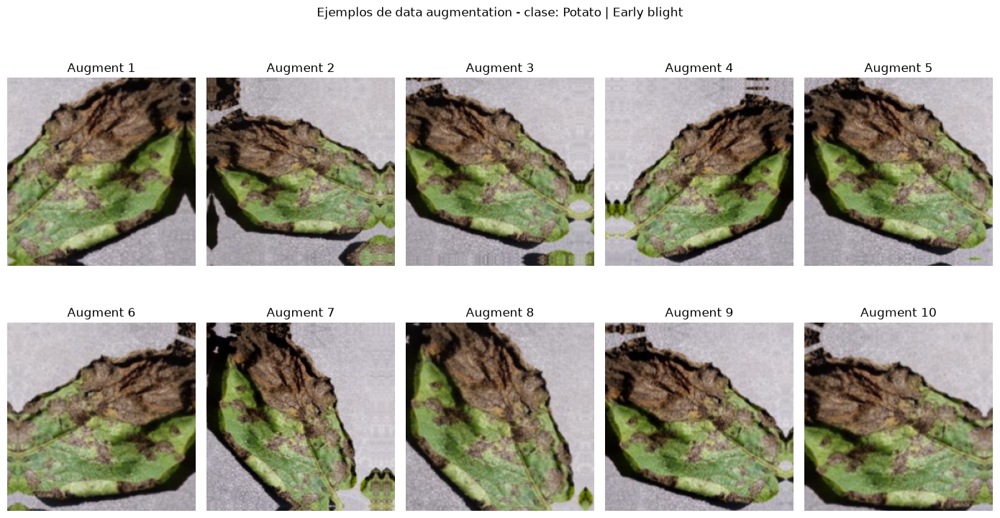

In [10]:
data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal", seed=SEED),
        layers.RandomRotation(0.08, seed=SEED + 1),
        layers.RandomZoom(0.12, seed=SEED + 2),
        layers.RandomTranslation(
            height_factor=0.08,
            width_factor=0.08,
            seed=SEED + 3
        ),
        layers.RandomContrast(0.10, seed=SEED + 4),
    ],
    name="data_augmentation"
)

sample_row = df_train.sample(1, random_state=SEED).iloc[0]
sample_image = (
    Image.open(sample_row["filepath"])
    .convert("RGB")
    .resize(IMAGE_SIZE)
)
sample_array = tf.expand_dims(
    tf.cast(np.array(sample_image), tf.float32),
    axis=0
)

plt.figure(figsize=(14, 8))
for i in range(10):
    augmented = data_augmentation(
        sample_array,
        training=True
    )[0].numpy().astype("uint8")

    ax = plt.subplot(2, 5, i + 1)
    ax.imshow(augmented)
    ax.set_title(f"Augment {i + 1}")
    ax.axis("off")

plt.suptitle(
    "Ejemplos de data augmentation - clase: "
    f"{clean_class_label(sample_row['class_name'])}"
)
plt.tight_layout()
plt.savefig(
    FIG_DIR / "ejemplos_data_augmentation.png",
    dpi=300,
    bbox_inches="tight"
)
plt.show()


## 10. Pesos por clase para desbalance

In [11]:
classes = np.array(sorted(df_train["label"].unique()))
weights = compute_class_weight(
    class_weight="balanced",
    classes=classes,
    y=df_train["label"].values
)
class_weight = {int(cls): float(weight) for cls, weight in zip(classes, weights)}

class_weight_df = pd.DataFrame({
    "label": list(class_weight.keys()),
    "class_name": [idx_to_class[idx] for idx in class_weight.keys()],
    "class_weight": list(class_weight.values())
})
class_weight_df.to_csv(TABLE_DIR / "pesos_clase.csv", index=False)
class_weight_df

,label,class_name,class_weight
0,0,"Pepper,_bell___Bacterial_spot",0.939902
1,1,"Pepper,_bell___healthy",0.909398
2,2,Potato___Early_blight,0.911247
3,3,Potato___Late_blight,0.911247
4,4,Potato___healthy,4.310897
5,5,Tomato___Bacterial_spot,0.911247
6,6,Tomato___Early_blight,0.911247
7,7,Tomato___Late_blight,0.926309
8,8,Tomato___Leaf_Mold,0.911247
9,9,Tomato___Septoria_leaf_spot,0.916837


## 11. Funciones de entrenamiento

In [12]:
training_time_records = []


def make_callbacks(model_name: str, monitor="val_accuracy"):
    checkpoint_path = MODEL_DIR / f"{model_name}.weights.h5"
    csv_path = TABLE_DIR / f"training_log_{model_name}.csv"

    callbacks = [
        keras.callbacks.ModelCheckpoint(
            filepath=str(checkpoint_path),
            monitor=monitor,
            mode="max",
            save_best_only=True,
            save_weights_only=True,
            verbose=1
        ),
        keras.callbacks.EarlyStopping(
            monitor=monitor,
            mode="max",
            patience=EARLY_STOPPING_PATIENCE,
            min_delta=1e-4,
            restore_best_weights=True,
            verbose=1
        ),
        keras.callbacks.ReduceLROnPlateau(
            monitor="val_loss",
            factor=0.3,
            patience=REDUCE_LR_PATIENCE,
            min_lr=1e-7,
            verbose=1
        ),
        keras.callbacks.TerminateOnNaN(),
        keras.callbacks.CSVLogger(str(csv_path))
    ]
    return callbacks


def timed_fit(model, model_family, phase, **fit_kwargs):
    start = time.perf_counter()
    history = model.fit(**fit_kwargs)
    elapsed = time.perf_counter() - start

    epochs_ran = len(history.history.get("loss", []))
    training_time_records.append({
        "model": model_family,
        "phase": phase,
        "seconds": elapsed,
        "minutes": elapsed / 60.0,
        "epochs_ran": epochs_ran,
        "seconds_per_epoch": elapsed / max(epochs_ran, 1)
    })

    print(
        f"Tiempo {model_family} / {phase}: "
        f"{elapsed / 60.0:.2f} min | "
        f"{epochs_ran} epocas"
    )
    return history


def history_to_dataframe(history, model_name):
    hist_df = pd.DataFrame(history.history)
    hist_df["epoch"] = np.arange(1, len(hist_df) + 1)
    hist_df["model"] = model_name
    return hist_df


def plot_metric_curve(history_df, metric, val_metric, title, savepath=None):
    plt.figure(figsize=(10, 6))
    plt.plot(
        history_df["epoch"],
        history_df[metric],
        marker="o",
        label=metric
    )
    plt.plot(
        history_df["epoch"],
        history_df[val_metric],
        marker="o",
        label=val_metric
    )
    plt.title(title)
    plt.xlabel("Epoca")
    plt.ylabel(metric.replace("_", " "))
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches="tight")

    plt.show()


def combine_history_dataframes(*history_dfs):
    if len(history_dfs) == 1:
        return history_dfs[0]

    combined = []
    offset = 0

    for hist_df in history_dfs:
        tmp = hist_df.copy()
        tmp["epoch"] = tmp["epoch"] + offset
        offset = tmp["epoch"].max()
        combined.append(tmp)

    return pd.concat(combined, ignore_index=True)


## 12. Arquitectura CNN

In [13]:
def build_cnn_baseline(input_shape, num_classes, learning_rate=1e-3):
    inputs = keras.Input(shape=input_shape, name="input_image")
    x = data_augmentation(inputs)
    x = layers.Rescaling(1.0 / 255.0, name="rescaling")(x)

    for block_idx, filters in enumerate([32, 64, 128, 256], start=1):
        x = layers.Conv2D(
            filters,
            kernel_size=3,
            padding="same",
            kernel_regularizer=keras.regularizers.l2(1e-4),
            name=f"conv{block_idx}_1"
        )(x)
        x = layers.BatchNormalization(name=f"bn{block_idx}_1")(x)
        x = layers.Activation("relu", name=f"relu{block_idx}_1")(x)

        x = layers.Conv2D(
            filters,
            kernel_size=3,
            padding="same",
            kernel_regularizer=keras.regularizers.l2(1e-4),
            name=f"conv{block_idx}_2"
        )(x)
        x = layers.BatchNormalization(name=f"bn{block_idx}_2")(x)
        x = layers.Activation("relu", name=f"relu{block_idx}_2")(x)

        x = layers.MaxPooling2D(name=f"pool{block_idx}")(x)
        x = layers.Dropout(0.15 if filters < 128 else 0.25, name=f"dropout_block{block_idx}")(x)

    x = layers.GlobalAveragePooling2D(name="global_average_pooling")(x)
    x = layers.Dense(
        256,
        activation="relu",
        kernel_regularizer=keras.regularizers.l2(1e-4),
        name="dense_features"
    )(x)
    x = layers.Dropout(0.45, name="dropout_classifier")(x)
    outputs = layers.Dense(num_classes, activation="softmax", dtype="float32", name="predictions")(x)

    model = keras.Model(inputs, outputs, name="cnn_base_propia")
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"],
        steps_per_execution=STEPS_PER_EXECUTION
    )
    return model

cnn_model = build_cnn_baseline(
    input_shape=(*IMAGE_SIZE, 3),
    num_classes=NUM_CLASSES,
    learning_rate=LR_CNN
)

cnn_model.summary()


Model: "cnn_base_propia"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_image (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_1 (Conv2D)                │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn1_1 (BatchNormalization)      │ (None, 224, 224, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu1_1 (Activation)            │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_2 (Conv2D)                │ (None, 224, 224, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn1_2 (BatchNormalization)      │ (None, 224, 224, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu1_2 (Activation)            │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_block1 (Dropout)        │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2_1 (Conv2D)                │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn2_1 (BatchNormalization)      │ (None, 112, 112, 64)   │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu2_1 (Activation)            │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2_2 (Conv2D)                │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn2_2 (BatchNormalization)      │ (None, 112, 112, 64)   │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu2_2 (Activation)            │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_block2 (Dropout)        │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3_1 (Conv2D)                │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn3_1 (BatchNormalization)      │ (None, 56, 56, 128)    │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu3_1 (Activation)            │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3_2 (Conv2D)                │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn3_2 (BatchNormalization)      │ (None, 56, 56, 128)    │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu3_2 (Activation)            │ (None, 56, 56, 128)    │             

 Total params: 1,245,743 (4.75 MB)

 Trainable params: 1,243,823 (4.74 MB)

 Non-trainable params: 1,920 (7.50 KB)

## 13. Entrenamiento CNN

Epoch 1/15
216/211 ━━━━━━━━━━━━━━━━━━━━ -13s 3s/step - accuracy: 0.4767 - loss: 1.6803
Epoch 1: val_accuracy improved from None to 0.07099, saving model to outputs\models\cnn_base.weights.h5

Epoch 1: finished saving model to outputs\models\cnn_base.weights.h5
211/211 ━━━━━━━━━━━━━━━━━━━━ 615s 3s/step - accuracy: 0.4767 - loss: 1.6803 - val_accuracy: 0.0710 - val_loss: 13.7039 - learning_rate: 0.0010
Epoch 2/15
216/211 ━━━━━━━━━━━━━━━━━━━━ -13s 3s/step - accuracy: 0.6346 - loss: 1.1576
Epoch 2: val_accuracy improved from 0.07099 to 0.10171, saving model to outputs\models\cnn_base.weights.h5

Epoch 2: finished saving model to outputs\models\cnn_base.weights.h5
211/211 ━━━━━━━━━━━━━━━━━━━━ 600s 3s/step - accuracy: 0.6346 - loss: 1.1576 - val_accuracy: 0.1017 - val_loss: 13.6369 - learning_rate: 0.0010
Epoch 3/15
216/211 ━━━━━━━━━━━━━━━━━━━━ -14s 3s/step - accuracy: 0.6978 - loss: 0.9806
Epoch 3: val_accuracy improved from 0.10171 to 0.51399, saving model to outputs\models\cnn_base.weight

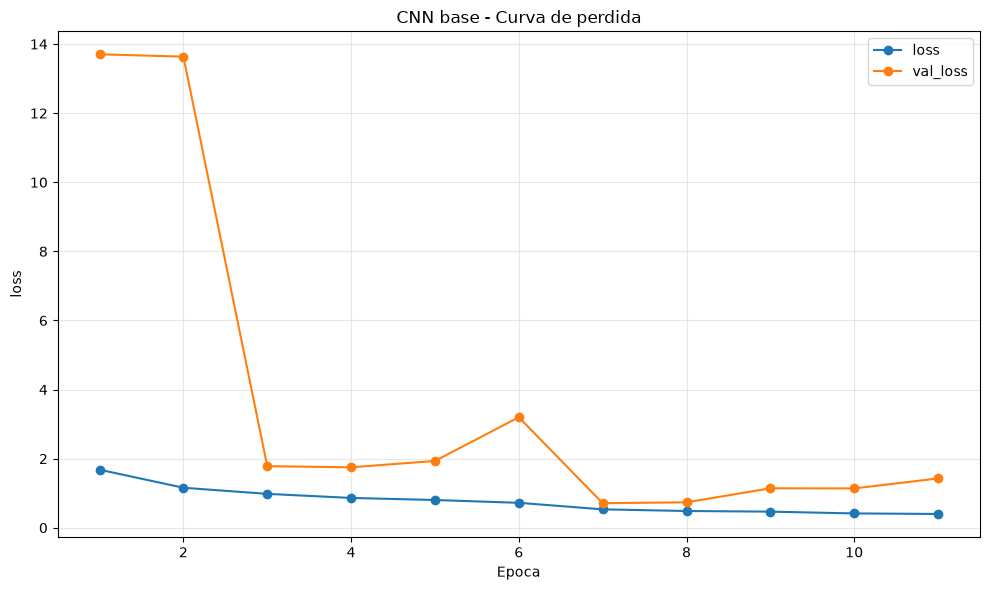

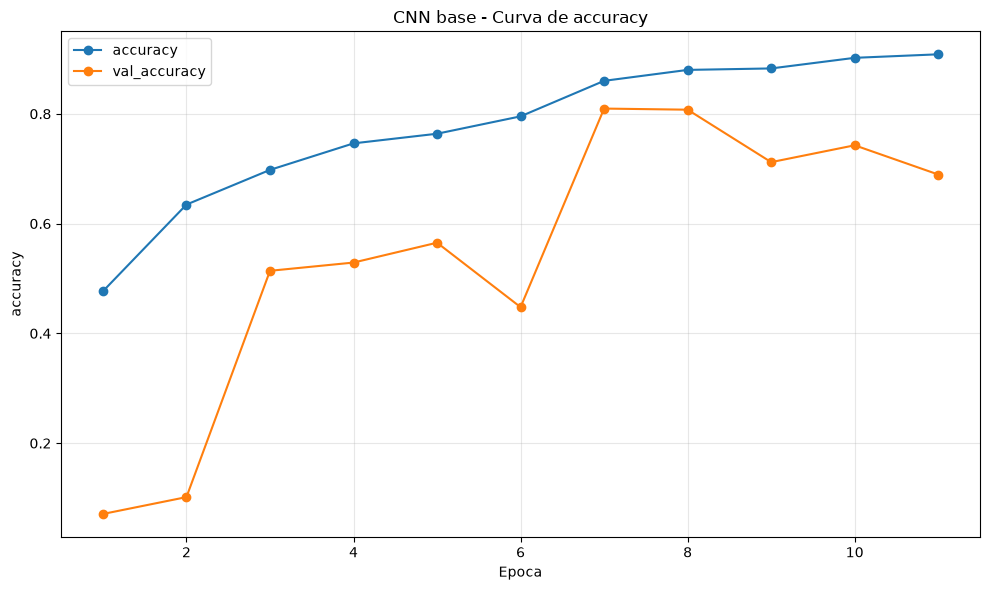

In [14]:
history_cnn = timed_fit(
    cnn_model,
    model_family="CNN base",
    phase="entrenamiento",
    x=train_ds,
    validation_data=val_ds,
    epochs=EPOCHS_CNN,
    class_weight=class_weight,
    callbacks=make_callbacks("cnn_base"),
    verbose=1
)

cnn_history_df = history_to_dataframe(history_cnn, "CNN base")
cnn_history_df.to_csv(TABLE_DIR / "history_cnn_base.csv", index=False)

plot_metric_curve(
    cnn_history_df,
    metric="loss",
    val_metric="val_loss",
    title="CNN base - Curva de perdida",
    savepath=FIG_DIR / "cnn_base_loss.png"
)

plot_metric_curve(
    cnn_history_df,
    metric="accuracy",
    val_metric="val_accuracy",
    title="CNN base - Curva de accuracy",
    savepath=FIG_DIR / "cnn_base_accuracy.png"
)


## 14. Arquitectura Transfer Learning MobileNetV2

In [15]:
def build_mobilenetv2_transfer_model(input_shape, num_classes, learning_rate=1e-3):
    inputs = keras.Input(shape=input_shape, name="input_image")
    x = data_augmentation(inputs)
    x = layers.Lambda(
        tf.keras.applications.mobilenet_v2.preprocess_input,
        name="mobilenetv2_preprocess"
    )(x)

    base_model = tf.keras.applications.MobileNetV2(
        input_tensor=x,
        include_top=False,
        weights="imagenet"
    )
    base_model.trainable = False

    x = base_model.output
    x = layers.GlobalAveragePooling2D(name="global_average_pooling")(x)
    x = layers.BatchNormalization(name="classifier_bn")(x)
    x = layers.Dropout(0.35, name="classifier_dropout_1")(x)
    x = layers.Dense(
        256,
        activation="relu",
        kernel_regularizer=keras.regularizers.l2(1e-4),
        name="classifier_dense"
    )(x)
    x = layers.Dropout(0.30, name="classifier_dropout_2")(x)
    outputs = layers.Dense(num_classes, activation="softmax", dtype="float32", name="predictions")(x)

    model = keras.Model(inputs, outputs, name="mobilenetv2_transfer_learning")
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"],
        steps_per_execution=STEPS_PER_EXECUTION
    )
    return model, base_model

transfer_model, mobilenet_base = build_mobilenetv2_transfer_model(
    input_shape=(*IMAGE_SIZE, 3),
    num_classes=NUM_CLASSES,
    learning_rate=LR_TRANSFER_HEAD
)

transfer_model.summary()
print("Capas entrenables antes de entrenar cabeza:", sum(layer.trainable for layer in transfer_model.layers))


Model: "mobilenetv2_transfer_learning"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_image         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ data_augmentation   │ (None, 224, 224,  │          0 │ input_image[0][0] │
│ (Sequential)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mobilenetv2_prepro… │ (None, 224, 224,  │          0 │ data_augmentatio… │
│ (Lambda)            │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ mobilenetv2_prep… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis

 Total params: 2,594,895 (9.90 MB)

 Trainable params: 334,351 (1.28 MB)

 Non-trainable params: 2,260,544 (8.62 MB)

Capas entrenables antes de entrenar cabeza: 6


## 15. Entrenamiento de cabeza clasificadora

Epoch 1/10
216/211 ━━━━━━━━━━━━━━━━━━━━ -2s 409ms/step - accuracy: 0.6659 - loss: 1.1329
Epoch 1: val_accuracy improved from None to 0.81092, saving model to outputs\models\mobilenetv2_head.weights.h5

Epoch 1: finished saving model to outputs\models\mobilenetv2_head.weights.h5
211/211 ━━━━━━━━━━━━━━━━━━━━ 107s 505ms/step - accuracy: 0.6659 - loss: 1.1329 - val_accuracy: 0.8109 - val_loss: 0.6262 - learning_rate: 0.0010
Epoch 2/10
216/211 ━━━━━━━━━━━━━━━━━━━━ -1s 387ms/step - accuracy: 0.7933 - loss: 0.6626
Epoch 2: val_accuracy improved from 0.81092 to 0.82662, saving model to outputs\models\mobilenetv2_head.weights.h5

Epoch 2: finished saving model to outputs\models\mobilenetv2_head.weights.h5
211/211 ━━━━━━━━━━━━━━━━━━━━ 100s 475ms/step - accuracy: 0.7933 - loss: 0.6626 - val_accuracy: 0.8266 - val_loss: 0.5467 - learning_rate: 0.0010
Epoch 3/10
216/211 ━━━━━━━━━━━━━━━━━━━━ -1s 392ms/step - accuracy: 0.8238 - loss: 0.5704
Epoch 3: val_accuracy did not improve from 0.82662
211/211 ━

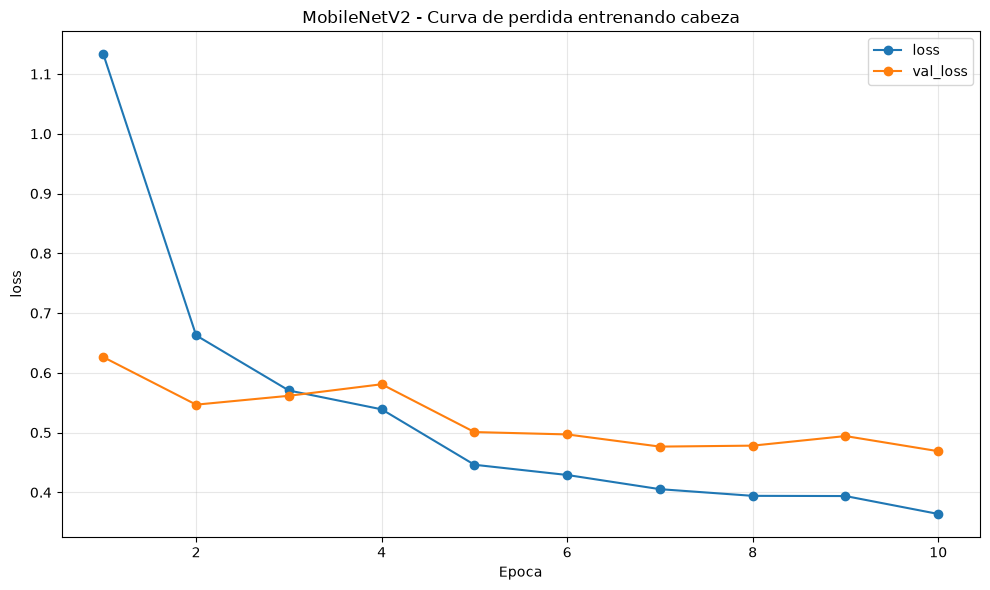

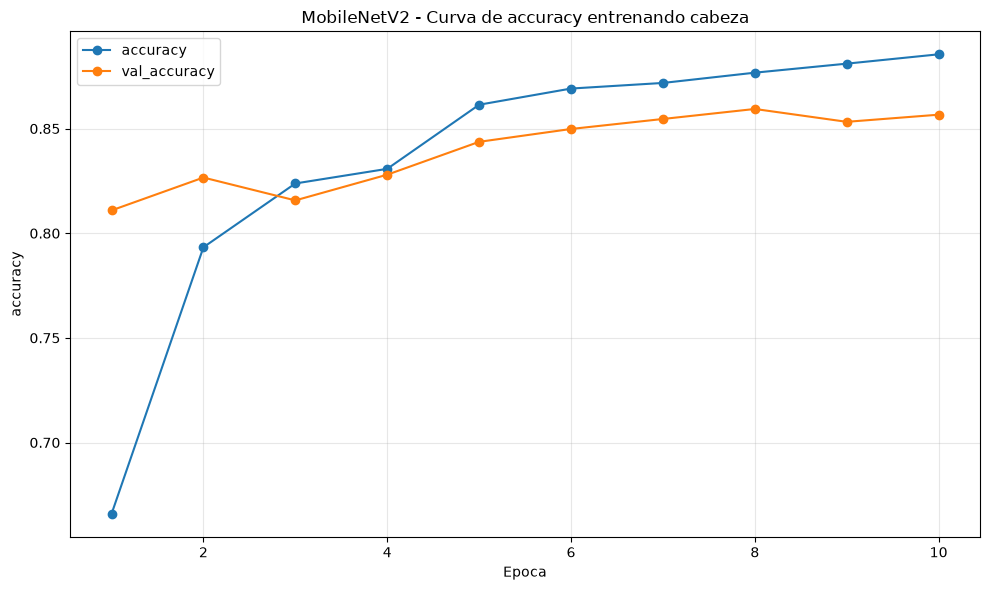

In [16]:
history_tl_head = timed_fit(
    transfer_model,
    model_family="MobileNetV2",
    phase="cabeza",
    x=train_ds,
    validation_data=val_ds,
    epochs=EPOCHS_TL_HEAD,
    class_weight=class_weight,
    callbacks=make_callbacks("mobilenetv2_head"),
    verbose=1
)

transfer_model.load_weights(MODEL_DIR / "mobilenetv2_head.weights.h5")

tl_head_history_df = history_to_dataframe(
    history_tl_head,
    "MobileNetV2 head"
)
tl_head_history_df.to_csv(
    TABLE_DIR / "history_mobilenetv2_head.csv",
    index=False
)

plot_metric_curve(
    tl_head_history_df,
    metric="loss",
    val_metric="val_loss",
    title="MobileNetV2 - Curva de perdida entrenando cabeza",
    savepath=FIG_DIR / "mobilenetv2_head_loss.png"
)

plot_metric_curve(
    tl_head_history_df,
    metric="accuracy",
    val_metric="val_accuracy",
    title="MobileNetV2 - Curva de accuracy entrenando cabeza",
    savepath=FIG_DIR / "mobilenetv2_head_accuracy.png"
)


## 16. Fine-tuning para el modelo preentrenado

Capas entrenables despues de activar fine-tuning: 29
Epoch 1/8
216/211 ━━━━━━━━━━━━━━━━━━━━ -2s 461ms/step - accuracy: 0.8914 - loss: 0.3585
Epoch 1: val_accuracy improved from None to 0.85529, saving model to outputs\models\mobilenetv2_finetuned.weights.h5

Epoch 1: finished saving model to outputs\models\mobilenetv2_finetuned.weights.h5
211/211 ━━━━━━━━━━━━━━━━━━━━ 121s 572ms/step - accuracy: 0.8914 - loss: 0.3585 - val_accuracy: 0.8553 - val_loss: 0.4885 - learning_rate: 1.0000e-05
Epoch 2/8
216/211 ━━━━━━━━━━━━━━━━━━━━ -2s 447ms/step - accuracy: 0.8880 - loss: 0.3686
Epoch 2: val_accuracy improved from 0.85529 to 0.85870, saving model to outputs\models\mobilenetv2_finetuned.weights.h5

Epoch 2: finished saving model to outputs\models\mobilenetv2_finetuned.weights.h5
211/211 ━━━━━━━━━━━━━━━━━━━━ 114s 538ms/step - accuracy: 0.8880 - loss: 0.3686 - val_accuracy: 0.8587 - val_loss: 0.4810 - learning_rate: 1.0000e-05
Epoch 3/8
216/211 ━━━━━━━━━━━━━━━━━━━━ -2s 432ms/step - accuracy: 0.90

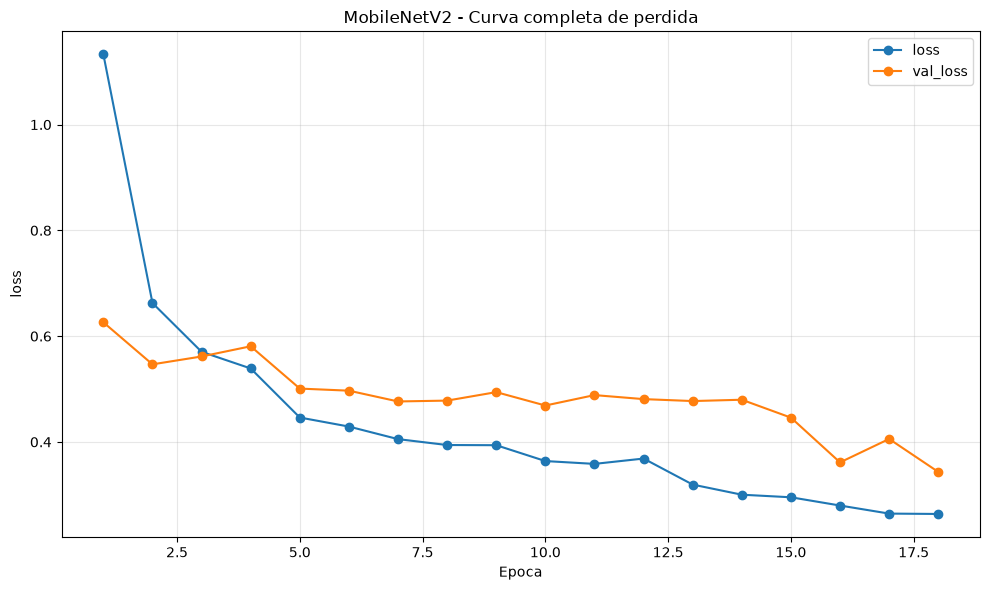

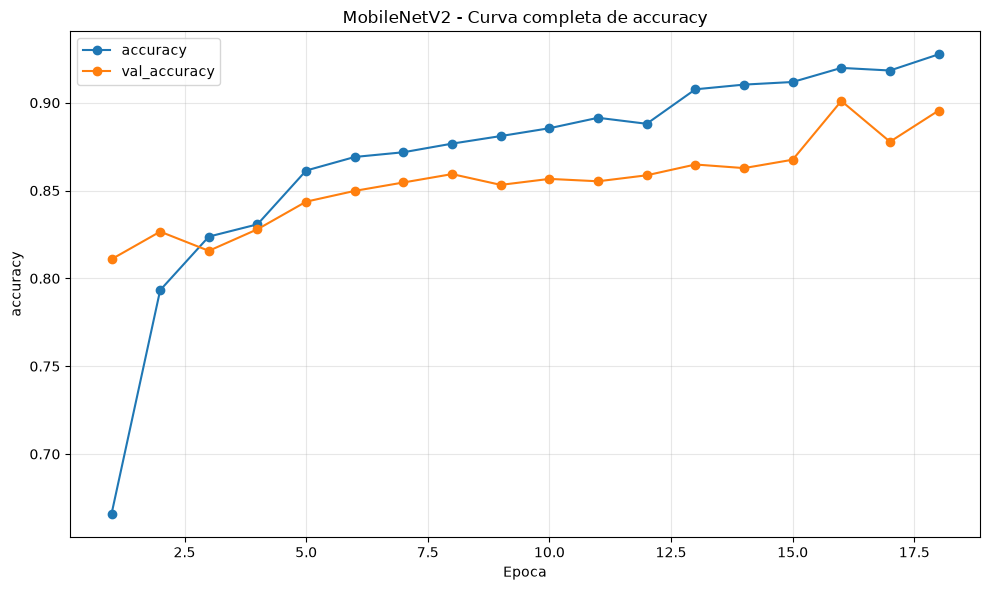

In [17]:
mobilenet_base.trainable = True

for layer in mobilenet_base.layers[:-FINE_TUNE_LAST_N_LAYERS]:
    layer.trainable = False

# BatchNormalization permanece congelada durante fine-tuning para evitar
# degradar las estadisticas preentrenadas con batches relativamente pequenos.
for layer in mobilenet_base.layers:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainable = False

transfer_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=LR_FINE_TUNING),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"],
    steps_per_execution=STEPS_PER_EXECUTION
)

print(
    "Capas entrenables despues de activar fine-tuning:",
    sum(layer.trainable for layer in transfer_model.layers)
)

history_tl_fine = timed_fit(
    transfer_model,
    model_family="MobileNetV2",
    phase="fine_tuning",
    x=train_ds,
    validation_data=val_ds,
    epochs=EPOCHS_TL_FINE,
    class_weight=class_weight,
    callbacks=make_callbacks("mobilenetv2_finetuned"),
    verbose=1
)

transfer_model.load_weights(
    MODEL_DIR / "mobilenetv2_finetuned.weights.h5"
)

tl_fine_history_df = history_to_dataframe(
    history_tl_fine,
    "MobileNetV2 fine-tuning"
)
tl_fine_history_df.to_csv(
    TABLE_DIR / "history_mobilenetv2_finetuning.csv",
    index=False
)

tl_combined_history_df = combine_history_dataframes(
    tl_head_history_df,
    tl_fine_history_df
)
tl_combined_history_df.to_csv(
    TABLE_DIR / "history_mobilenetv2_completo.csv",
    index=False
)

plot_metric_curve(
    tl_combined_history_df,
    metric="loss",
    val_metric="val_loss",
    title="MobileNetV2 - Curva completa de perdida",
    savepath=FIG_DIR / "mobilenetv2_completo_loss.png"
)

plot_metric_curve(
    tl_combined_history_df,
    metric="accuracy",
    val_metric="val_accuracy",
    title="MobileNetV2 - Curva completa de accuracy",
    savepath=FIG_DIR / "mobilenetv2_completo_accuracy.png"
)


## 17. Arquitectura Transfer Learning EfficientNetB0

In [18]:
def build_efficientnetb0_transfer_model(input_shape, num_classes, learning_rate=1e-3):

    inputs = keras.Input(shape=input_shape, name="input_image")
    x = data_augmentation(inputs)

    base_model = tf.keras.applications.EfficientNetB0(
        input_tensor=x,
        include_top=False,
        weights="imagenet"
    )
    base_model.trainable = False

    x = base_model.output
    x = layers.GlobalAveragePooling2D(name="global_average_pooling")(x)
    x = layers.BatchNormalization(name="classifier_bn")(x)
    x = layers.Dropout(0.40, name="classifier_dropout_1")(x)
    x = layers.Dense(
        256,
        activation="relu",
        kernel_regularizer=keras.regularizers.l2(1e-4),
        name="classifier_dense"
    )(x)
    x = layers.Dropout(0.30, name="classifier_dropout_2")(x)
    outputs = layers.Dense(num_classes, activation="softmax", dtype="float32", name="predictions")(x)

    model = keras.Model(inputs, outputs, name="efficientnetb0_transfer_learning")
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"],
        steps_per_execution=STEPS_PER_EXECUTION
    )
    return model, base_model


efficientnet_model, efficientnet_base = build_efficientnetb0_transfer_model(
    input_shape=(*IMAGE_SIZE, 3),
    num_classes=NUM_CLASSES,
    learning_rate=LR_EFFICIENTNET_HEAD
)

efficientnet_model.summary()
print("Capas entrenables antes de entrenar cabeza:", sum(layer.trainable for layer in efficientnet_model.layers))


Model: "efficientnetb0_transfer_learning"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_image         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ data_augmentation   │ (None, 224, 224,  │          0 │ input_image[0][0] │
│ (Sequential)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ data_augmentatio… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati

 Total params: 4,386,482 (16.73 MB)

 Trainable params: 334,351 (1.28 MB)

 Non-trainable params: 4,052,131 (15.46 MB)

Capas entrenables antes de entrenar cabeza: 6


## 18. Entrenamiento EfficientNetB0

Epoch 1/8
216/211 ━━━━━━━━━━━━━━━━━━━━ -2s 523ms/step - accuracy: 0.6540 - loss: 1.1553
Epoch 1: val_accuracy improved from None to 0.82457, saving model to outputs\models\efficientnetb0_head.weights.h5

Epoch 1: finished saving model to outputs\models\efficientnetb0_head.weights.h5
211/211 ━━━━━━━━━━━━━━━━━━━━ 136s 646ms/step - accuracy: 0.6540 - loss: 1.1553 - val_accuracy: 0.8246 - val_loss: 0.6185 - learning_rate: 0.0010
Epoch 2/8
216/211 ━━━━━━━━━━━━━━━━━━━━ -2s 488ms/step - accuracy: 0.7933 - loss: 0.6635
Epoch 2: val_accuracy improved from 0.82457 to 0.85734, saving model to outputs\models\efficientnetb0_head.weights.h5

Epoch 2: finished saving model to outputs\models\efficientnetb0_head.weights.h5
211/211 ━━━━━━━━━━━━━━━━━━━━ 127s 601ms/step - accuracy: 0.7933 - loss: 0.6635 - val_accuracy: 0.8573 - val_loss: 0.4720 - learning_rate: 0.0010
Epoch 3/8
216/211 ━━━━━━━━━━━━━━━━━━━━ -2s 488ms/step - accuracy: 0.8293 - loss: 0.5570
Epoch 3: val_accuracy improved from 0.85734 to 0.86

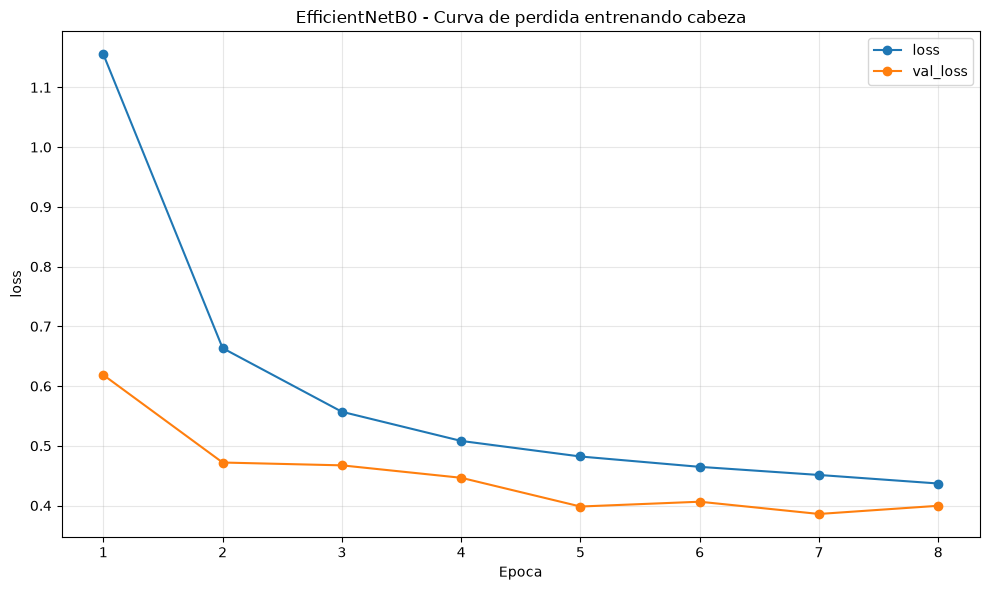

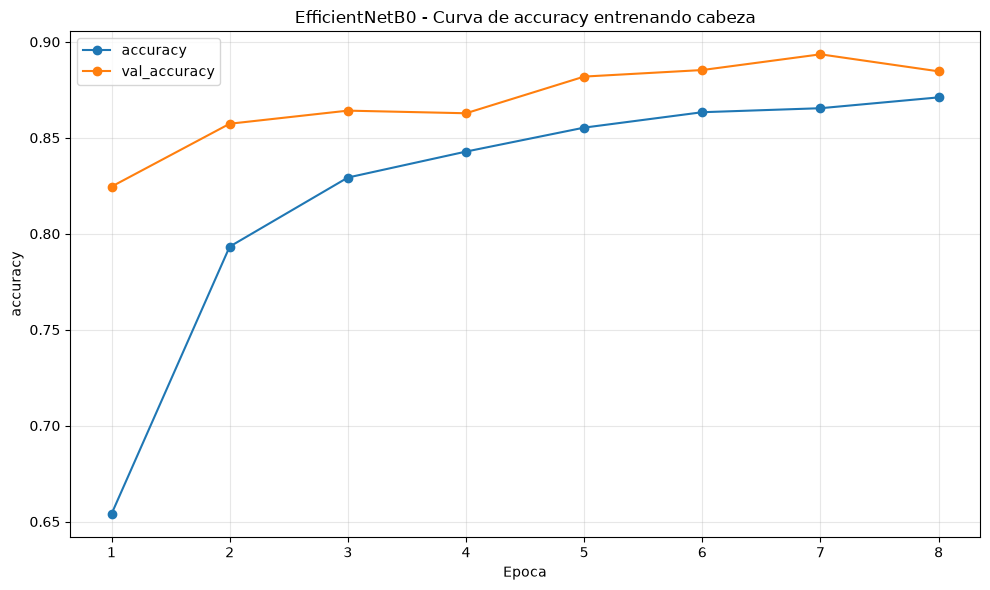

In [19]:
history_eff_head = timed_fit(
    efficientnet_model,
    model_family="EfficientNetB0",
    phase="cabeza",
    x=train_ds,
    validation_data=val_ds,
    epochs=EPOCHS_EFF_HEAD,
    class_weight=class_weight,
    callbacks=make_callbacks("efficientnetb0_head"),
    verbose=1
)

efficientnet_model.load_weights(
    MODEL_DIR / "efficientnetb0_head.weights.h5"
)

eff_head_history_df = history_to_dataframe(
    history_eff_head,
    "EfficientNetB0 head"
)
eff_head_history_df.to_csv(
    TABLE_DIR / "history_efficientnetb0_head.csv",
    index=False
)

plot_metric_curve(
    eff_head_history_df,
    metric="loss",
    val_metric="val_loss",
    title="EfficientNetB0 - Curva de perdida entrenando cabeza",
    savepath=FIG_DIR / "efficientnetb0_head_loss.png"
)

plot_metric_curve(
    eff_head_history_df,
    metric="accuracy",
    val_metric="val_accuracy",
    title="EfficientNetB0 - Curva de accuracy entrenando cabeza",
    savepath=FIG_DIR / "efficientnetb0_head_accuracy.png"
)


## 19. Fine-tuning EfficientNetB0

Capas entrenables despues de activar fine-tuning: 38
Epoch 1/6
216/211 ━━━━━━━━━━━━━━━━━━━━ -3s 636ms/step - accuracy: 0.8894 - loss: 0.3841
Epoch 1: val_accuracy improved from None to 0.89966, saving model to outputs\models\efficientnetb0_finetuned.weights.h5

Epoch 1: finished saving model to outputs\models\efficientnetb0_finetuned.weights.h5
211/211 ━━━━━━━━━━━━━━━━━━━━ 161s 764ms/step - accuracy: 0.8894 - loss: 0.3841 - val_accuracy: 0.8997 - val_loss: 0.3617 - learning_rate: 1.0000e-05
Epoch 2/6
216/211 ━━━━━━━━━━━━━━━━━━━━ -2s 571ms/step - accuracy: 0.9075 - loss: 0.3290
Epoch 2: val_accuracy did not improve from 0.89966
211/211 ━━━━━━━━━━━━━━━━━━━━ 145s 687ms/step - accuracy: 0.9075 - loss: 0.3290 - val_accuracy: 0.8956 - val_loss: 0.3608 - learning_rate: 1.0000e-05
Epoch 3/6
216/211 ━━━━━━━━━━━━━━━━━━━━ -2s 568ms/step - accuracy: 0.9108 - loss: 0.3145
Epoch 3: val_accuracy improved from 0.89966 to 0.90034, saving model to outputs\models\efficientnetb0_finetuned.weights.h5

Epoc

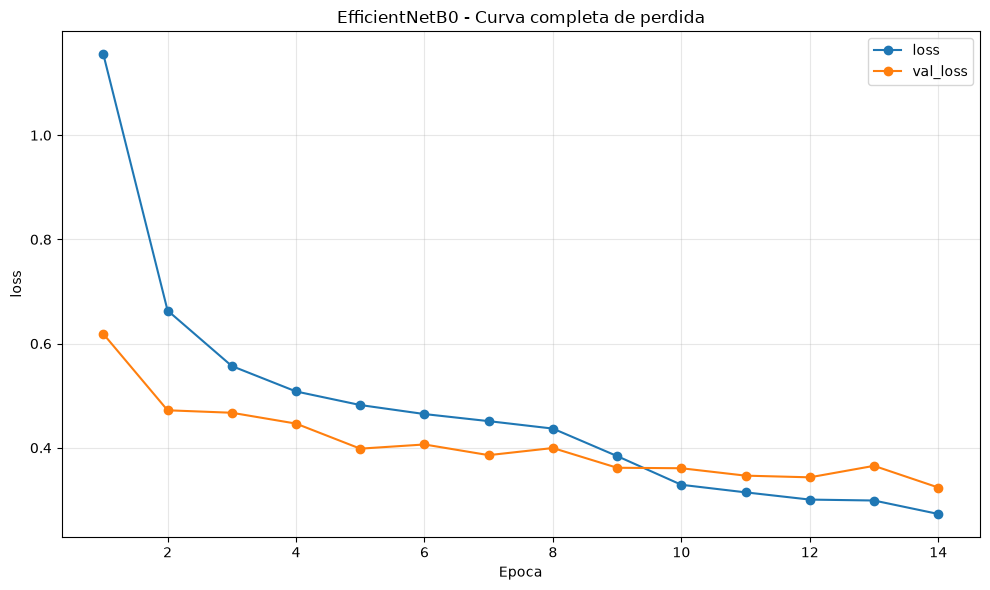

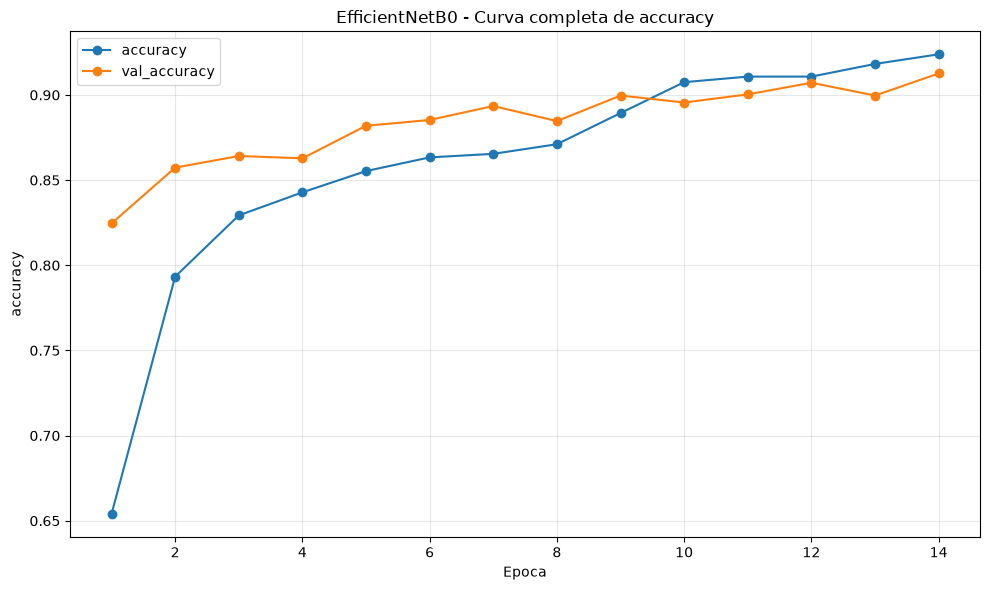

In [20]:
efficientnet_base.trainable = True

for layer in efficientnet_base.layers[:-FINE_TUNE_EFFICIENTNET_LAST_N_LAYERS]:
    layer.trainable = False

for layer in efficientnet_base.layers:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainable = False

efficientnet_model.compile(
    optimizer=keras.optimizers.Adam(
        learning_rate=LR_EFFICIENTNET_FINE
    ),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"],
    steps_per_execution=STEPS_PER_EXECUTION
)

print(
    "Capas entrenables despues de activar fine-tuning:",
    sum(layer.trainable for layer in efficientnet_model.layers)
)

history_eff_fine = timed_fit(
    efficientnet_model,
    model_family="EfficientNetB0",
    phase="fine_tuning",
    x=train_ds,
    validation_data=val_ds,
    epochs=EPOCHS_EFF_FINE,
    class_weight=class_weight,
    callbacks=make_callbacks("efficientnetb0_finetuned"),
    verbose=1
)

efficientnet_model.load_weights(
    MODEL_DIR / "efficientnetb0_finetuned.weights.h5"
)

eff_fine_history_df = history_to_dataframe(
    history_eff_fine,
    "EfficientNetB0 fine-tuning"
)
eff_fine_history_df.to_csv(
    TABLE_DIR / "history_efficientnetb0_finetuning.csv",
    index=False
)

eff_combined_history_df = combine_history_dataframes(
    eff_head_history_df,
    eff_fine_history_df
)
eff_combined_history_df.to_csv(
    TABLE_DIR / "history_efficientnetb0_completo.csv",
    index=False
)

plot_metric_curve(
    eff_combined_history_df,
    metric="loss",
    val_metric="val_loss",
    title="EfficientNetB0 - Curva completa de perdida",
    savepath=FIG_DIR / "efficientnetb0_completo_loss.png"
)

plot_metric_curve(
    eff_combined_history_df,
    metric="accuracy",
    val_metric="val_accuracy",
    title="EfficientNetB0 - Curva completa de accuracy",
    savepath=FIG_DIR / "efficientnetb0_completo_accuracy.png"
)


## 20. Funciones para metricas

In [21]:
def collect_predictions(model, dataset):
    y_true_batches = []
    y_prob_batches = []

    # Llamar directamente al modelo evita crear un ciclo predict() independiente por batch.
    for images, labels in dataset:
        probabilities = model(images, training=False)
        y_true_batches.append(labels.numpy())
        y_prob_batches.append(tf.cast(probabilities, tf.float32).numpy())

    y_true = np.concatenate(y_true_batches)
    y_prob = np.vstack(y_prob_batches)
    y_pred = np.argmax(y_prob, axis=1)
    return y_true, y_pred, y_prob

def summarize_metrics(y_true, y_pred, y_prob, model_name, split_name):
    summary = {
        "model": model_name,
        "split": split_name,
        "accuracy": accuracy_score(y_true, y_pred),
        "precision_macro": precision_score(y_true, y_pred, average="macro", zero_division=0),
        "recall_macro": recall_score(y_true, y_pred, average="macro", zero_division=0),
        "f1_macro": f1_score(y_true, y_pred, average="macro", zero_division=0),
        "precision_weighted": precision_score(y_true, y_pred, average="weighted", zero_division=0),
        "recall_weighted": recall_score(y_true, y_pred, average="weighted", zero_division=0),
        "f1_weighted": f1_score(y_true, y_pred, average="weighted", zero_division=0),
    }

    try:
        summary["auc_roc_macro_ovr"] = roc_auc_score(
            y_true,
            y_prob,
            multi_class="ovr",
            average="macro"
        )
        summary["auc_roc_weighted_ovr"] = roc_auc_score(
            y_true,
            y_prob,
            multi_class="ovr",
            average="weighted"
        )
    except Exception as exc:
        summary["auc_roc_macro_ovr"] = np.nan
        summary["auc_roc_weighted_ovr"] = np.nan
        print(f"No se pudo calcular AUC-ROC para {model_name} - {split_name}: {exc}")

    return summary


def plot_confusion_matrix_normalized(y_true, y_pred, class_names, title, savepath=None):
    cm = confusion_matrix(
        y_true,
        y_pred,
        labels=np.arange(len(class_names)),
        normalize="true"
    )

    fig, ax = plt.subplots(figsize=(14, 12))
    im = ax.imshow(cm, aspect="auto")
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    ax.set_title(title, fontsize=14)
    ax.set_xlabel("Clase predicha")
    ax.set_ylabel("Clase real")
    ax.set_xticks(np.arange(len(class_names)))
    ax.set_yticks(np.arange(len(class_names)))
    ax.set_xticklabels(short_class_names, rotation=75, ha="right", fontsize=8)
    ax.set_yticklabels(short_class_names, fontsize=8)

    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            value = cm[i, j]
            if value >= 0.01:
                ax.text(j, i, f"{value:.2f}", ha="center", va="center", fontsize=7)

    plt.tight_layout()
    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches="tight")
    plt.show()


def plot_multiclass_roc(y_true, y_prob, class_names, title, savepath=None):
    n_classes = len(class_names)
    y_bin = label_binarize(y_true, classes=np.arange(n_classes))

    if y_bin.shape[1] != n_classes:
        print("No es posible graficar ROC: no estan todas las clases en este split.")
        return

    fpr = {}
    tpr = {}
    roc_auc = {}

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    fpr["micro"], tpr["micro"], _ = roc_curve(y_bin.ravel(), y_prob.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
    mean_tpr /= n_classes
    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    plt.figure(figsize=(11, 8))
    plt.plot(fpr["micro"], tpr["micro"], linewidth=2.5, label=f"micro-average AUC = {roc_auc['micro']:.3f}")
    plt.plot(fpr["macro"], tpr["macro"], linewidth=2.5, label=f"macro-average AUC = {roc_auc['macro']:.3f}")

    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], linewidth=1, alpha=0.35)

    plt.plot([0, 1], [0, 1], linestyle="--", linewidth=1)
    plt.title(title)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches="tight")
    plt.show()


def evaluate_model(model, model_name, split_datasets, class_names, save_prefix):
    summaries = []
    predictions = {}

    for split_name, dataset in split_datasets.items():
        print(f"Evaluando {model_name} en {split_name}")

        y_true, y_pred, y_prob = collect_predictions(model, dataset)
        predictions[split_name] = {
            "y_true": y_true,
            "y_pred": y_pred,
            "y_prob": y_prob
        }

        summary = summarize_metrics(y_true, y_pred, y_prob, model_name, split_name)
        summaries.append(summary)

        report = classification_report(
            y_true,
            y_pred,
            target_names=class_names,
            zero_division=0,
            output_dict=True
        )
        report_df = pd.DataFrame(report).T
        report_df.to_csv(TABLE_DIR / f"classification_report_{save_prefix}_{split_name.lower()}.csv")

        print(classification_report(
            y_true,
            y_pred,
            target_names=class_names,
            zero_division=0
        ))

        if split_name in DETAILED_EVALUATION_SPLITS:
            plot_confusion_matrix_normalized(
                y_true,
                y_pred,
                class_names,
                title=f"{model_name} - Matriz de confusión normalizada ({split_name})",
                savepath=FIG_DIR / f"confusion_matrix_{save_prefix}_{split_name.lower()}.png"
            )

            plot_multiclass_roc(
                y_true,
                y_prob,
                class_names,
                title=f"{model_name} - Curvas ROC multiclase ({split_name})",
                savepath=FIG_DIR / f"roc_auc_{save_prefix}_{split_name.lower()}.png"
            )

    summary_df = pd.DataFrame(summaries)
    summary_df.to_csv(TABLE_DIR / f"metrics_summary_{save_prefix}.csv", index=False)
    return summary_df, predictions

candidate_split_datasets = {
    "Train": train_ds,
    "Validation": val_ds
}

# Test queda fuera de la fase de seleccion. Se utiliza despues de fijar
# el ganador por Validation.


## 21. Evaluacion de CNN en Train y Validation

In [22]:
cnn_summary_df, cnn_predictions = evaluate_model(
    model=cnn_model,
    model_name="CNN base",
    split_datasets=candidate_split_datasets,
    class_names=class_names,
    save_prefix="cnn_base"
)

cnn_summary_df

Evaluando CNN base en Train
                                               precision    recall  f1-score   support

                Pepper,_bell___Bacterial_spot       0.96      0.89      0.93       477
                       Pepper,_bell___healthy       0.93      0.95      0.94       493
                        Potato___Early_blight       0.81      1.00      0.90       492
                         Potato___Late_blight       0.86      0.84      0.85       492
                             Potato___healthy       0.59      1.00      0.74       104
                      Tomato___Bacterial_spot       0.96      0.90      0.93       492
                        Tomato___Early_blight       0.88      0.76      0.81       492
                         Tomato___Late_blight       0.89      0.67      0.76       484
                           Tomato___Leaf_Mold       0.98      0.76      0.86       492
                  Tomato___Septoria_leaf_spot       0.84      0.85      0.84       489
Tomato___Spide

,model,split,accuracy,precision_macro,recall_macro,f1_macro,precision_weighted,recall_weighted,f1_weighted,auc_roc_macro_ovr,auc_roc_weighted_ovr
0,CNN base,Train,0.853978,0.85527,0.861063,0.849543,0.867655,0.853978,0.854566,0.993982,0.993485
1,CNN base,Validation,0.809556,0.81643,0.819870,0.804304,0.834369,0.809556,0.812392,0.989200,0.988332


## 22. Evaluacion de MobileNetV2 en Train y Validation

In [23]:
mobilenet_summary_df, mobilenet_predictions = evaluate_model(
    model=transfer_model,
    model_name="MobileNetV2 fine-tuned",
    split_datasets=candidate_split_datasets,
    class_names=class_names,
    save_prefix="mobilenetv2_finetuned"
)

mobilenet_summary_df

Evaluando MobileNetV2 fine-tuned en Train
                                               precision    recall  f1-score   support

                Pepper,_bell___Bacterial_spot       0.94      1.00      0.97       477
                       Pepper,_bell___healthy       1.00      0.95      0.97       493
                        Potato___Early_blight       0.99      0.98      0.98       492
                         Potato___Late_blight       0.96      0.98      0.97       492
                             Potato___healthy       0.96      1.00      0.98       104
                      Tomato___Bacterial_spot       0.89      0.99      0.94       492
                        Tomato___Early_blight       0.99      0.77      0.86       492
                         Tomato___Late_blight       0.94      0.98      0.96       484
                           Tomato___Leaf_Mold       0.94      0.98      0.96       492
                  Tomato___Septoria_leaf_spot       0.96      0.92      0.94       489


,model,split,accuracy,precision_macro,recall_macro,f1_macro,precision_weighted,recall_weighted,f1_weighted,auc_roc_macro_ovr,auc_roc_weighted_ovr
0,MobileNetV2 fine-tuned,Train,0.952565,0.956294,0.954638,0.953997,0.954447,0.952565,0.951954,0.999356,0.999297
1,MobileNetV2 fine-tuned,Validation,0.901024,0.904700,0.903058,0.900930,0.905831,0.901024,0.900306,0.996808,0.996659


## 23. Evaluacion de EfficientNetB0 en Train y Validation

In [24]:
efficientnet_summary_df, efficientnet_predictions = evaluate_model(
    model=efficientnet_model,
    model_name="EfficientNetB0 fine-tuned",
    split_datasets=candidate_split_datasets,
    class_names=class_names,
    save_prefix="efficientnetb0_finetuned"
)

efficientnet_summary_df

Evaluando EfficientNetB0 fine-tuned en Train
                                               precision    recall  f1-score   support

                Pepper,_bell___Bacterial_spot       0.99      1.00      0.99       477
                       Pepper,_bell___healthy       1.00      0.99      0.99       493
                        Potato___Early_blight       0.98      1.00      0.99       492
                         Potato___Late_blight       0.98      0.98      0.98       492
                             Potato___healthy       0.94      1.00      0.97       104
                      Tomato___Bacterial_spot       0.98      0.96      0.97       492
                        Tomato___Early_blight       0.99      0.85      0.91       492
                         Tomato___Late_blight       0.97      0.98      0.98       484
                           Tomato___Leaf_Mold       0.99      0.96      0.98       492
                  Tomato___Septoria_leaf_spot       0.94      0.96      0.95       4

,model,split,accuracy,precision_macro,recall_macro,f1_macro,precision_weighted,recall_weighted,f1_weighted,auc_roc_macro_ovr,auc_roc_weighted_ovr
0,EfficientNetB0 fine-tuned,Train,0.960595,0.962254,0.963768,0.962042,0.962798,0.960595,0.960694,0.999415,0.999362
1,EfficientNetB0 fine-tuned,Validation,0.912628,0.905992,0.916484,0.906716,0.919877,0.912628,0.913031,0.997281,0.997107


## 24. Comparacion de modelos

In [25]:
comparison_df = pd.concat(
    [
        cnn_summary_df,
        mobilenet_summary_df,
        efficientnet_summary_df
    ],
    ignore_index=True
)

comparison_df.to_csv(
    TABLE_DIR / "comparacion_modelos_train_validation.csv",
    index=False
)

training_times_df = pd.DataFrame(training_time_records)
training_times_df.to_csv(
    TABLE_DIR / "tiempos_entrenamiento_por_fase.csv",
    index=False
)

training_time_summary_df = (
    training_times_df
    .groupby("model", as_index=False)
    .agg(
        total_seconds=("seconds", "sum"),
        total_minutes=("minutes", "sum"),
        total_epochs=("epochs_ran", "sum")
    )
    .sort_values("total_seconds")
)

training_time_summary_df.to_csv(
    TABLE_DIR / "tiempos_entrenamiento_por_modelo.csv",
    index=False
)

print("Metricas disponibles antes de abrir TEST:")
display(comparison_df)

print("Tiempos de entrenamiento:")
display(training_time_summary_df)


Metricas disponibles antes de abrir TEST:


,model,split,accuracy,precision_macro,recall_macro,f1_macro,precision_weighted,recall_weighted,f1_weighted,auc_roc_macro_ovr,auc_roc_weighted_ovr
0,CNN base,Train,0.853978,0.855270,0.861063,0.849543,0.867655,0.853978,0.854566,0.993982,0.993485
1,CNN base,Validation,0.809556,0.816430,0.819870,0.804304,0.834369,0.809556,0.812392,0.989200,0.988332
2,MobileNetV2 fine-tuned,Train,0.952565,0.956294,0.954638,0.953997,0.954447,0.952565,0.951954,0.999356,0.999297
3,MobileNetV2 fine-tuned,Validation,0.901024,0.904700,0.903058,0.900930,0.905831,0.901024,0.900306,0.996808,0.996659
4,EfficientNetB0 fine-tuned,Train,0.960595,0.962254,0.963768,0.962042,0.962798,0.960595,0.960694,0.999415,0.999362
5,EfficientNetB0 fine-tuned,Validation,0.912628,0.905992,0.916484,0.906716,0.919877,0.912628,0.913031,0.997281,0.997107


Tiempos de entrenamiento:


,model,total_seconds,total_minutes,total_epochs
2,MobileNetV2,1910.818703,31.846978,18
1,EfficientNetB0,1916.169695,31.936162,14
0,CNN base,7020.419914,117.006999,11


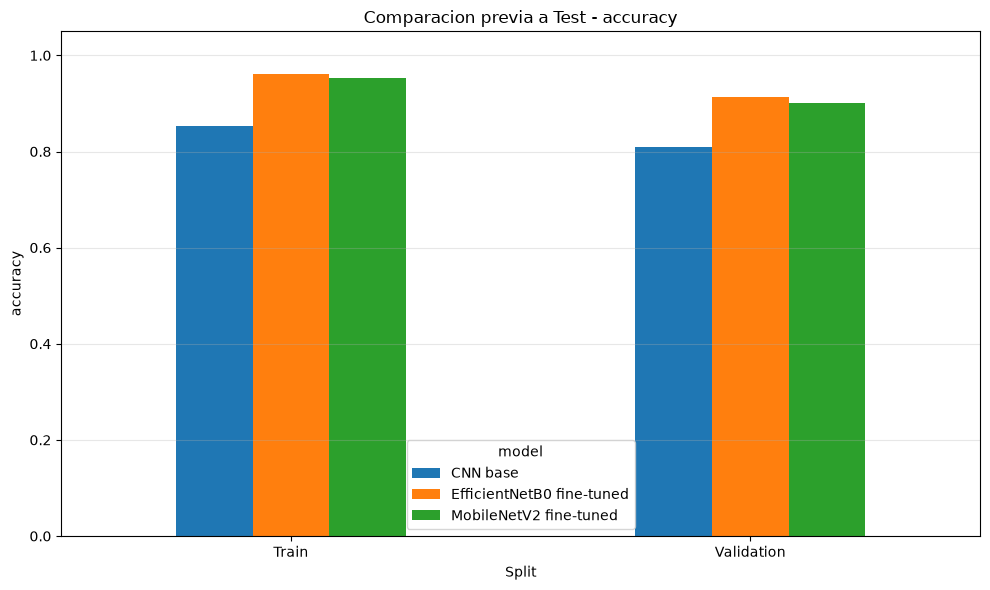

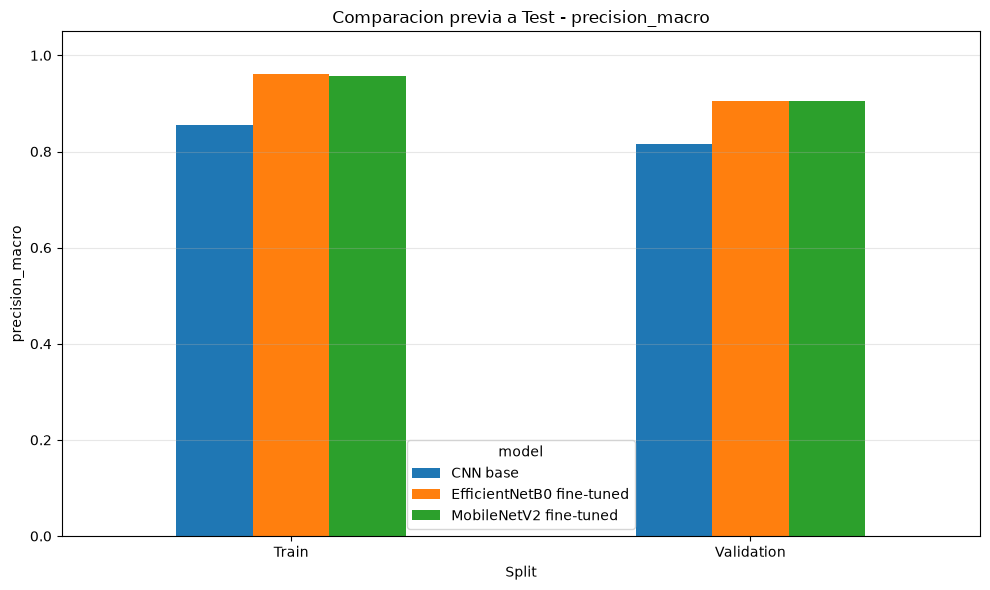

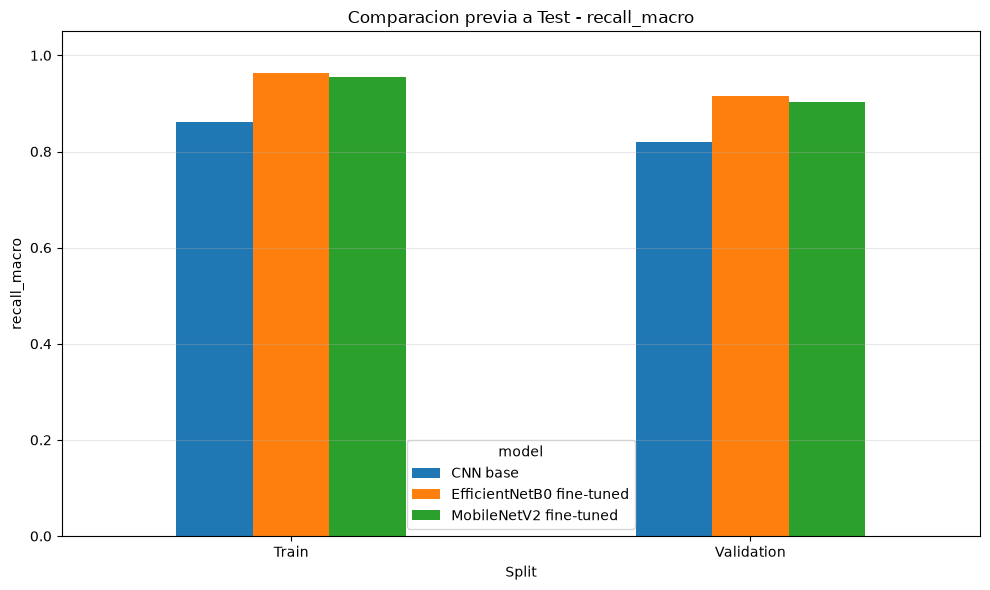

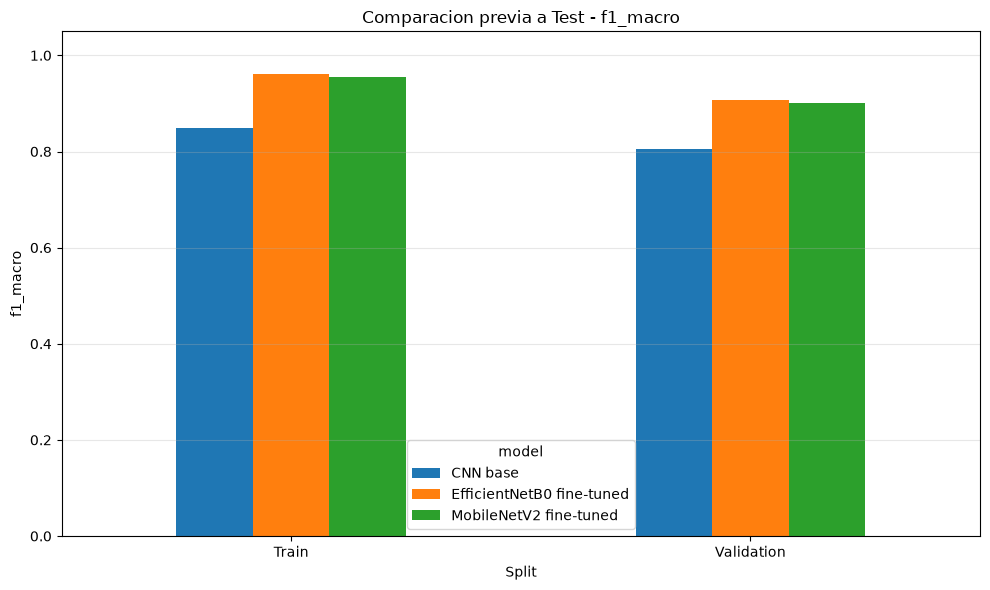

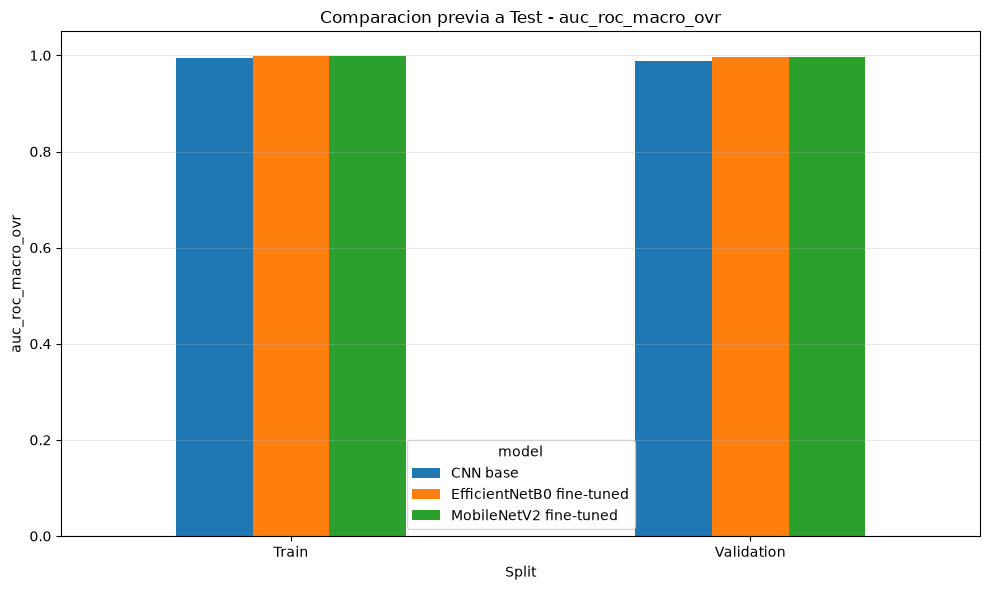

In [26]:
metrics_to_plot = [
    "accuracy",
    "precision_macro",
    "recall_macro",
    "f1_macro",
    "auc_roc_macro_ovr"
]

for metric in metrics_to_plot:
    pivot_metric = comparison_df.pivot(
        index="split",
        columns="model",
        values=metric
    )
    pivot_metric = pivot_metric.reindex(
        ["Train", "Validation"]
    )

    pivot_metric.plot(
        kind="bar",
        figsize=(10, 6)
    )
    plt.title(
        f"Comparacion previa a Test - {metric}"
    )
    plt.xlabel("Split")
    plt.ylabel(metric)
    plt.ylim(0, 1.05)
    plt.xticks(rotation=0)
    plt.grid(True, axis="y", alpha=0.3)
    plt.tight_layout()
    plt.savefig(
        FIG_DIR / f"comparacion_pretest_{metric}.png",
        dpi=300,
        bbox_inches="tight"
    )
    plt.show()


## 25. Seleccion por Validation y apertura final de Test

El ganador se fija usando exclusivamente `F1 macro` de Validation. Solo **despues** de esa decision se ejecuta Test. De esta manera Test no interviene en entrenamiento, ajuste de hiperparametros ni seleccion del modelo.

Despues de fijar el ganador se calcula, una sola vez, el benchmark final de los tres modelos en Test para conservar la comparacion experimental. Las visualizaciones detalladas de Test se generan para el modelo seleccionado.


Criterio de seleccion: F1 macro en VALIDATION
Ganador fijado antes de abrir TEST: EfficientNetB0 fine-tuned


,model,split,accuracy,precision_macro,recall_macro,f1_macro,precision_weighted,recall_weighted,f1_weighted,auc_roc_macro_ovr,auc_roc_weighted_ovr
5,EfficientNetB0 fine-tuned,Validation,0.912628,0.905992,0.916484,0.906716,0.919877,0.912628,0.913031,0.997281,0.997107
3,MobileNetV2 fine-tuned,Validation,0.901024,0.904700,0.903058,0.900930,0.905831,0.901024,0.900306,0.996808,0.996659
1,CNN base,Validation,0.809556,0.816430,0.819870,0.804304,0.834369,0.809556,0.812392,0.989200,0.988332


Evaluacion final TEST: CNN base
Evaluacion final TEST: MobileNetV2 fine-tuned
Evaluacion final TEST: EfficientNetB0 fine-tuned
Modelo final guardado en: outputs\models\efficientnetb0_fine_tuned_modelo_final.keras

Benchmark final en TEST, realizado despues de fijar el ganador:


,model,split,accuracy,precision_macro,recall_macro,f1_macro,precision_weighted,recall_weighted,f1_weighted,auc_roc_macro_ovr,auc_roc_weighted_ovr
2,EfficientNetB0 fine-tuned,Test,0.926593,0.931454,0.931481,0.928915,0.931945,0.926593,0.926649,0.998206,0.998035
1,MobileNetV2 fine-tuned,Test,0.908587,0.912686,0.913276,0.909570,0.913121,0.908587,0.907565,0.997210,0.997004
0,CNN base,Test,0.823407,0.832351,0.832468,0.818968,0.842139,0.823407,0.822579,0.991550,0.990588



Resultado final del modelo seleccionado:


,model,split,accuracy,precision_macro,recall_macro,f1_macro,precision_weighted,recall_weighted,f1_weighted,auc_roc_macro_ovr,auc_roc_weighted_ovr
2,EfficientNetB0 fine-tuned,Test,0.926593,0.931454,0.931481,0.928915,0.931945,0.926593,0.926649,0.998206,0.998035


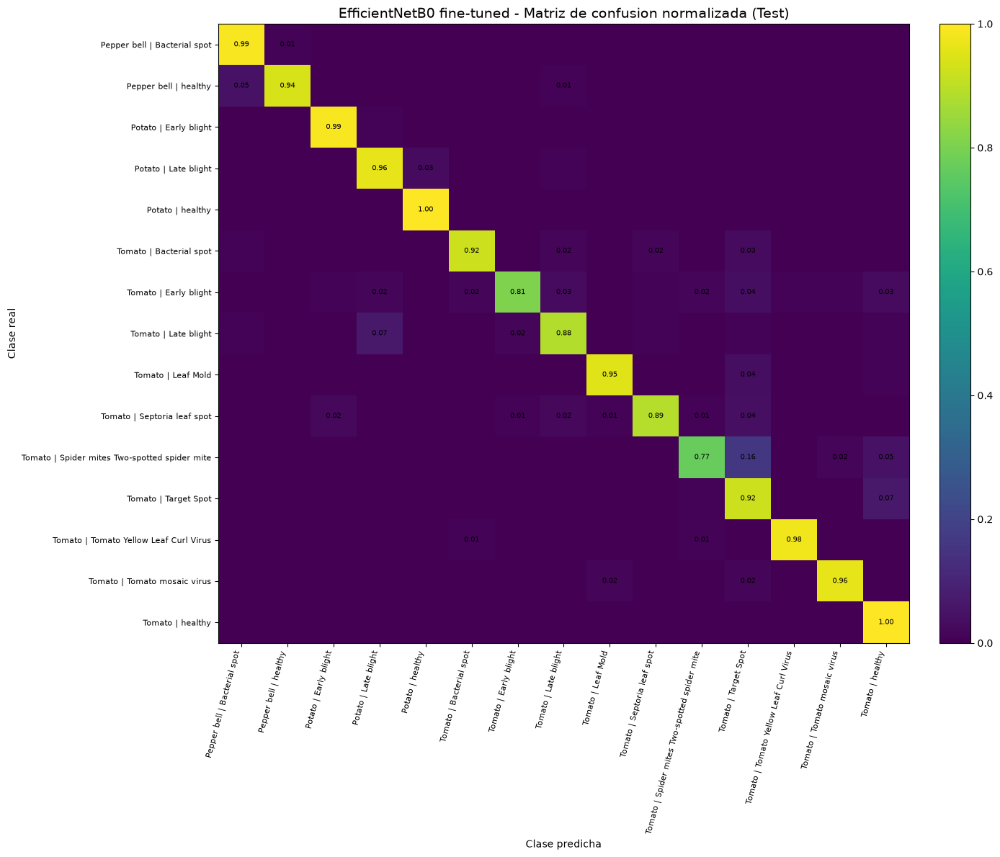

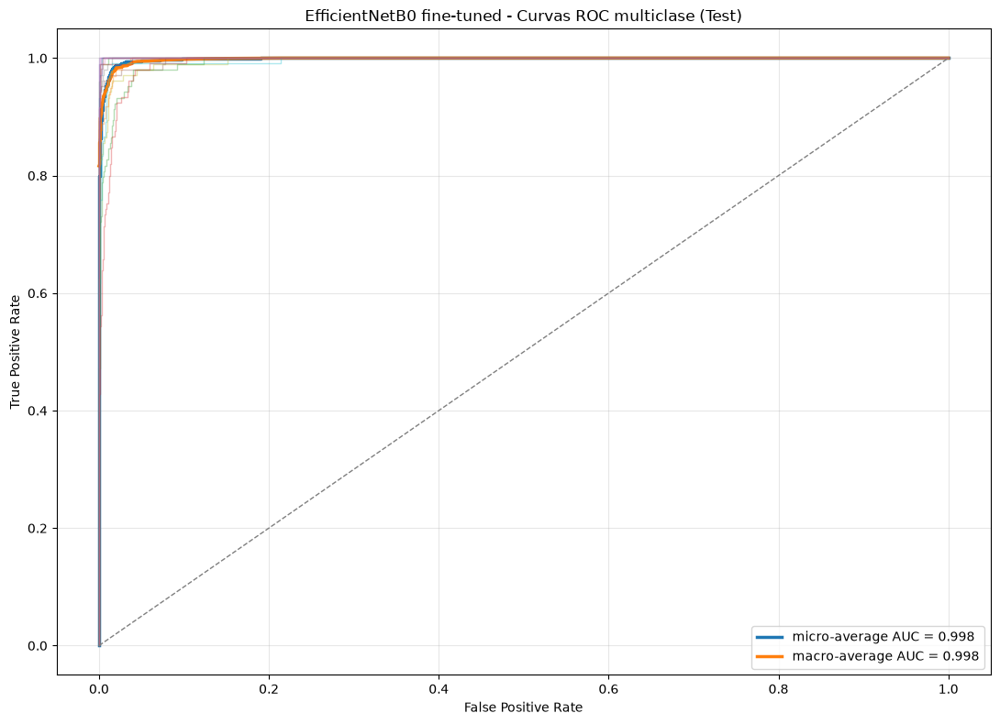

In [27]:
model_registry = {
    "CNN base": cnn_model,
    "MobileNetV2 fine-tuned": transfer_model,
    "EfficientNetB0 fine-tuned": efficientnet_model,
}

predictions_registry = {
    "CNN base": cnn_predictions,
    "MobileNetV2 fine-tuned": mobilenet_predictions,
    "EfficientNetB0 fine-tuned": efficientnet_predictions,
}

# -------------------------------------------------------------------------
# 1. FIJAR EL GANADOR SIN USAR TEST
# -------------------------------------------------------------------------
validation_comparison_df = comparison_df[
    comparison_df["split"] == "Validation"
].copy()

validation_comparison_df = validation_comparison_df.sort_values(
    ["f1_macro", "accuracy"],
    ascending=[False, False]
)

BEST_MODEL_DISPLAY_NAME = validation_comparison_df.iloc[0]["model"]
BEST_MODEL = model_registry[BEST_MODEL_DISPLAY_NAME]

BEST_MODEL_SLUG = re.sub(
    r"[^a-z0-9]+",
    "_",
    BEST_MODEL_DISPLAY_NAME.lower()
).strip("_")

validation_comparison_df.to_csv(
    TABLE_DIR / "seleccion_modelo_por_validation.csv",
    index=False
)

print("Criterio de seleccion: F1 macro en VALIDATION")
print("Ganador fijado antes de abrir TEST:", BEST_MODEL_DISPLAY_NAME)
display(validation_comparison_df)

# -------------------------------------------------------------------------
# 2. TEST FINAL: se ejecuta solo despues de fijar el ganador
# -------------------------------------------------------------------------
test_summaries = []

for model_name, model in model_registry.items():
    print(f"Evaluacion final TEST: {model_name}")

    y_true, y_pred, y_prob = collect_predictions(
        model,
        test_ds
    )

    predictions_registry[model_name]["Test"] = {
        "y_true": y_true,
        "y_pred": y_pred,
        "y_prob": y_prob
    }

    test_summaries.append(
        summarize_metrics(
            y_true,
            y_pred,
            y_prob,
            model_name,
            "Test"
        )
    )

    report_df = pd.DataFrame(
        classification_report(
            y_true,
            y_pred,
            target_names=class_names,
            zero_division=0,
            output_dict=True
        )
    ).T

    report_df.to_csv(
        TABLE_DIR /
        f"classification_report_final_test_{re.sub(r'[^a-z0-9]+', '_', model_name.lower()).strip('_')}.csv"
    )

test_benchmark_df = pd.DataFrame(test_summaries)
test_benchmark_df.to_csv(
    TABLE_DIR / "benchmark_final_test_todos_modelos.csv",
    index=False
)

comparison_all_splits_df = pd.concat(
    [comparison_df, test_benchmark_df],
    ignore_index=True
)
comparison_all_splits_df.to_csv(
    TABLE_DIR / "comparacion_modelos_train_validation_test_final.csv",
    index=False
)

best_predictions = predictions_registry[BEST_MODEL_DISPLAY_NAME]

final_test_result_df = test_benchmark_df[
    test_benchmark_df["model"] == BEST_MODEL_DISPLAY_NAME
].copy()

final_test_result_df.to_csv(
    TABLE_DIR / "resultado_final_test_modelo_seleccionado.csv",
    index=False
)

FINAL_MODEL_PATH = MODEL_DIR / f"{BEST_MODEL_SLUG}_modelo_final.keras"
BEST_MODEL.save(FINAL_MODEL_PATH)
print("Modelo final guardado en:", FINAL_MODEL_PATH)

print("\nBenchmark final en TEST, realizado despues de fijar el ganador:")
display(test_benchmark_df.sort_values("f1_macro", ascending=False))

print("\nResultado final del modelo seleccionado:")
display(final_test_result_df)

# Graficos detallados de TEST solo para el modelo seleccionado.
y_true_best_test = best_predictions["Test"]["y_true"]
y_pred_best_test = best_predictions["Test"]["y_pred"]
y_prob_best_test = best_predictions["Test"]["y_prob"]

plot_confusion_matrix_normalized(
    y_true_best_test,
    y_pred_best_test,
    class_names,
    title=f"{BEST_MODEL_DISPLAY_NAME} - Matriz de confusion normalizada (Test)",
    savepath=FIG_DIR / f"confusion_matrix_final_{BEST_MODEL_SLUG}_test.png"
)

plot_multiclass_roc(
    y_true_best_test,
    y_prob_best_test,
    class_names,
    title=f"{BEST_MODEL_DISPLAY_NAME} - Curvas ROC multiclase (Test)",
    savepath=FIG_DIR / f"roc_auc_final_{BEST_MODEL_SLUG}_test.png"
)


## 26. Metricas por clase del mejor modelo en test

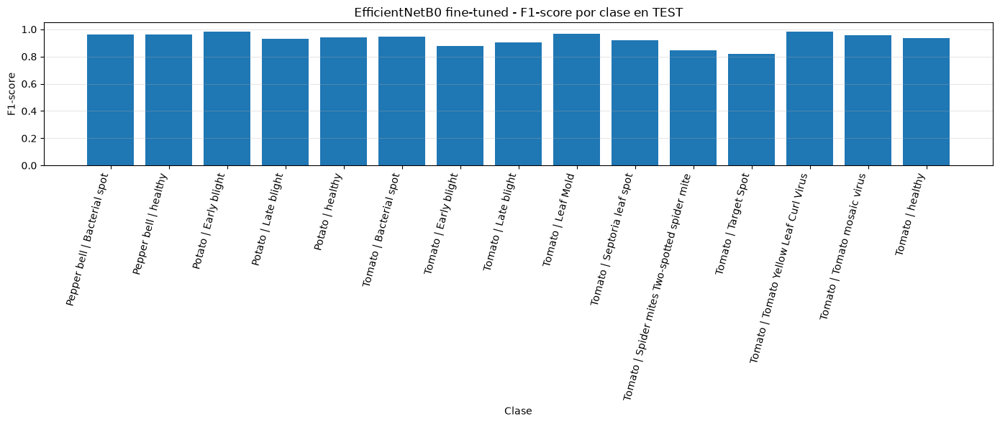

,precision,recall,f1-score,support,class_label_clean
"Pepper,_bell___Bacterial_spot",0.933962,0.990000,0.961165,100.0,Pepper bell | Bacterial spot
"Pepper,_bell___healthy",0.989362,0.939394,0.963731,99.0,Pepper bell | healthy
Potato___Early_blight,0.971698,0.990385,0.980952,104.0,Potato | Early blight
Potato___Late_blight,0.900901,0.961538,0.930233,104.0,Potato | Late blight
Potato___healthy,0.888889,1.000000,0.941176,24.0,Potato | healthy
Tomato___Bacterial_spot,0.969697,0.923077,0.945813,104.0,Tomato | Bacterial spot
Tomato___Early_blight,0.965517,0.807692,0.879581,104.0,Tomato | Early blight
Tomato___Late_blight,0.921739,0.883333,0.902128,120.0,Tomato | Late blight
Tomato___Leaf_Mold,0.980198,0.951923,0.965854,104.0,Tomato | Leaf Mold
Tomato___Septoria_leaf_spot,0.956044,0.887755,0.920635,98.0,Tomato | Septoria leaf spot


In [28]:
y_true_test = best_predictions["Test"]["y_true"]
y_pred_test = best_predictions["Test"]["y_pred"]

report_test = classification_report(
    y_true_test,
    y_pred_test,
    target_names=class_names,
    zero_division=0,
    output_dict=True
)

report_test_df = pd.DataFrame(report_test).T
per_class_test_df = report_test_df.loc[class_names, ["precision", "recall", "f1-score", "support"]].copy()
per_class_test_df["class_label_clean"] = short_class_names
per_class_test_df.to_csv(TABLE_DIR / f"metricas_por_clase_test_{BEST_MODEL_SLUG}.csv")

plt.figure(figsize=(14, 6))
plt.bar(per_class_test_df["class_label_clean"], per_class_test_df["f1-score"])
plt.title(f"{BEST_MODEL_DISPLAY_NAME} - F1-score por clase en TEST")
plt.xlabel("Clase")
plt.ylabel("F1-score")
plt.ylim(0, 1.05)
plt.xticks(rotation=75, ha="right")
plt.grid(True, axis="y", alpha=0.3)
plt.tight_layout()
plt.savefig(FIG_DIR / f"f1_score_por_clase_test_{BEST_MODEL_SLUG}.png", dpi=300, bbox_inches="tight")
plt.show()

per_class_test_df

## 27. Predicciones aleatorias

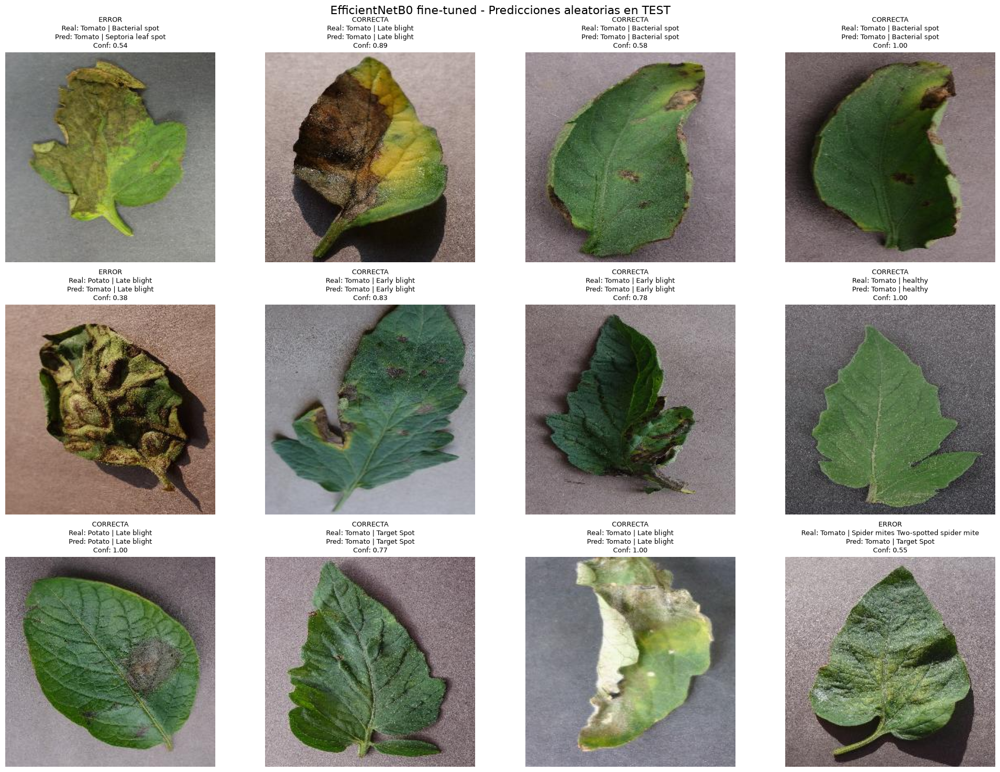

In [29]:
def predict_single_image(model, image_path):
    image_bytes = tf.io.read_file(str(image_path))
    image = tf.io.decode_image(image_bytes, channels=3, expand_animations=False)
    image.set_shape([None, None, 3])
    image = tf.image.resize(image, IMAGE_SIZE, antialias=False)
    image = tf.cast(image, tf.float32)
    image_batch = tf.expand_dims(image, axis=0)
    probs = tf.cast(model(image_batch, training=False)[0], tf.float32).numpy()
    pred_idx = int(np.argmax(probs))
    confidence = float(np.max(probs))
    return pred_idx, confidence, probs


def plot_prediction_grid(model, df, class_names, n=12, seed=42, savepath=None):
    sample_df = df.sample(n=min(n, len(df)), random_state=seed).reset_index(drop=True)
    n_cols = 4
    n_rows = math.ceil(len(sample_df) / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
    axes = np.array(axes).reshape(-1)

    for i, row in sample_df.iterrows():
        pred_idx, confidence, _ = predict_single_image(model, row["filepath"])
        true_idx = int(row["label"])
        img = Image.open(row["filepath"]).convert("RGB")
        axes[i].imshow(img)
        result_tag = "CORRECTA" if pred_idx == true_idx else "ERROR"
        title = (
            f"{result_tag}\n"
            f"Real: {clean_class_label(class_names[true_idx])}\n"
            f"Pred: {clean_class_label(class_names[pred_idx])}\n"
            f"Conf: {confidence:.2f}"
        )
        axes[i].set_title(title, fontsize=9)
        axes[i].axis("off")

    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.suptitle(f"{BEST_MODEL_DISPLAY_NAME} - Predicciones aleatorias en TEST", fontsize=16)
    plt.tight_layout()
    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches="tight")
    plt.show()

plot_prediction_grid(
    BEST_MODEL,
    df_test,
    class_names,
    n=12,
    seed=SEED,
    savepath=FIG_DIR / f"predicciones_aleatorias_test_{BEST_MODEL_SLUG}.png"
)


## 28. Errores con mayor confianza

In [30]:
def build_prediction_dataframe(df, predictions_dict, split_name, class_names):
    pred_data = predictions_dict[split_name]
    output_df = df.copy().reset_index(drop=True)
    output_df["y_true"] = pred_data["y_true"]
    output_df["y_pred"] = pred_data["y_pred"]
    output_df["confidence"] = pred_data["y_prob"].max(axis=1)
    output_df["true_class"] = output_df["y_true"].map(lambda idx: class_names[int(idx)])
    output_df["pred_class"] = output_df["y_pred"].map(lambda idx: class_names[int(idx)])
    output_df["is_correct"] = output_df["y_true"] == output_df["y_pred"]
    return output_df


test_predictions_df = build_prediction_dataframe(
    df_test,
    best_predictions,
    "Test",
    class_names
)

test_errors_df = test_predictions_df[test_predictions_df["is_correct"] == False].copy()
test_errors_df = test_errors_df.sort_values("confidence", ascending=False)
test_errors_df.to_csv(TABLE_DIR / f"errores_test_{BEST_MODEL_SLUG}.csv", index=False)

print("Numero de errores en TEST:", len(test_errors_df))
print("Tasa de error en TEST:", len(test_errors_df) / len(test_predictions_df))

test_errors_df[["filepath", "true_class", "pred_class", "confidence"]].head(20)

Numero de errores en TEST: 106
Tasa de error en TEST: 0.07340720221606649


,filepath,true_class,pred_class,confidence
295,D:\DataScience\proyecto Main\data\plantvillage...,Potato___Late_blight,Potato___healthy,0.998029
839,D:\DataScience\proyecto Main\data\plantvillage...,Potato___Late_blight,Potato___healthy,0.997821
1125,D:\DataScience\proyecto Main\data\plantvillage...,Tomato___Spider_mites Two-spotted_spider_mite,Tomato___Target_Spot,0.976153
1421,D:\DataScience\proyecto Main\data\plantvillage...,Tomato___Spider_mites Two-spotted_spider_mite,Tomato___Target_Spot,0.970867
646,D:\DataScience\proyecto Main\data\plantvillage...,Tomato___Early_blight,Tomato___Spider_mites Two-spotted_spider_mite,0.968004
161,D:\DataScience\proyecto Main\data\plantvillage...,Tomato___Spider_mites Two-spotted_spider_mite,Tomato___healthy,0.966792
120,D:\DataScience\proyecto Main\data\plantvillage...,Tomato___Target_Spot,Tomato___healthy,0.965953
835,D:\DataScience\proyecto Main\data\plantvillage...,Tomato___Spider_mites Two-spotted_spider_mite,Tomato___Target_Spot,0.952782
713,D:\DataScience\proyecto Main\data\plantvillage...,Tomato___Late_blight,"Pepper,_bell___Bacterial_spot",0.937394
1332,D:\DataScience\proyecto Main\data\plantvillage...,Tomato___Bacterial_spot,Tomato___Late_blight,0.933198


## 29. Imagenes de errores mas confiados

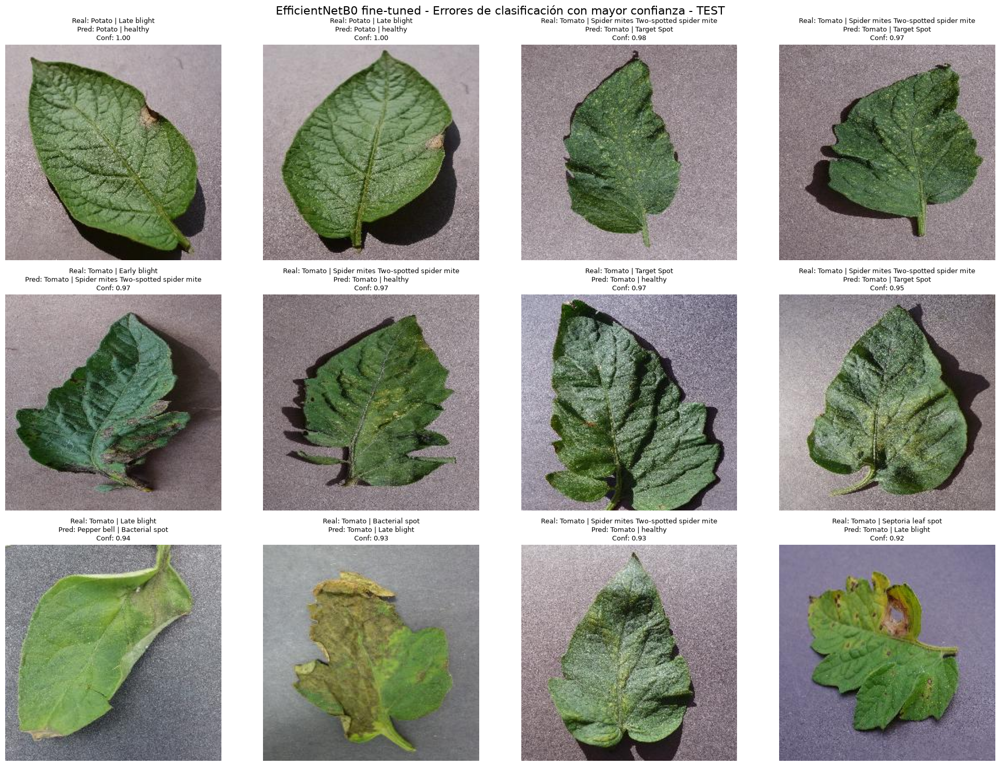

In [31]:
def plot_error_gallery(errors_df, n=12, savepath=None):
    if len(errors_df) == 0:
        print("No hay errores para visualizar en este split.")
        return

    sample_df = errors_df.head(n).reset_index(drop=True)
    n_cols = 4
    n_rows = math.ceil(len(sample_df) / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
    axes = np.array(axes).reshape(-1)

    for i, row in sample_df.iterrows():
        img = Image.open(row["filepath"]).convert("RGB")
        axes[i].imshow(img)
        axes[i].set_title(
            f"Real: {clean_class_label(row['true_class'])}\n"
            f"Pred: {clean_class_label(row['pred_class'])}\n"
            f"Conf: {row['confidence']:.2f}",
            fontsize=9
        )
        axes[i].axis("off")

    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.suptitle(f"{BEST_MODEL_DISPLAY_NAME} - Errores de clasificación con mayor confianza - TEST", fontsize=16)
    plt.tight_layout()
    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches="tight")
    plt.show()

plot_error_gallery(
    test_errors_df,
    n=12,
    savepath=FIG_DIR / f"errores_mayor_confianza_test_{BEST_MODEL_SLUG}.png"
)

## 30. Grad-CAM para el mejor modelo

Ultima capa convolucional detectada: top_conv


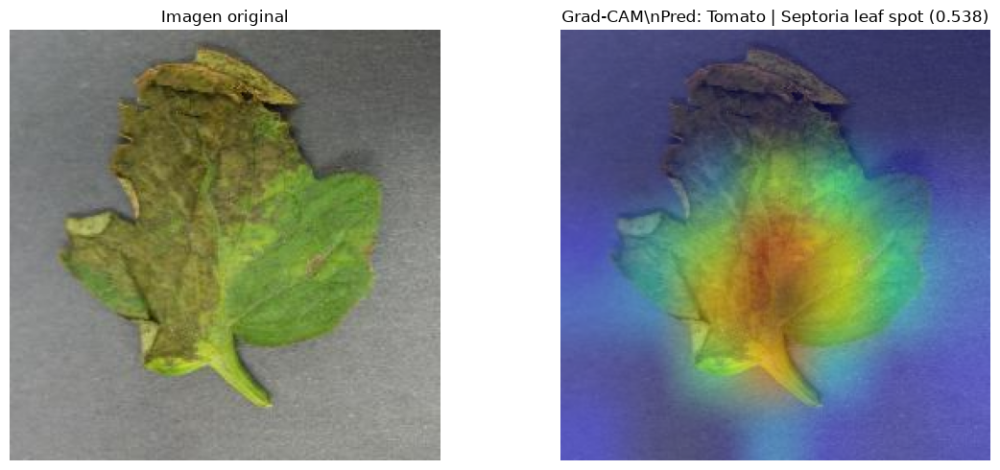

In [32]:
def find_last_conv_layer(model):
    """
    Busca la ultima Conv2D, incluyendo backbones anidados como
    MobileNetV2 y EfficientNetB0.
    """
    for layer in reversed(model.layers):
        if isinstance(layer, layers.Conv2D):
            return layer, None

        if isinstance(layer, keras.Model):
            for nested_layer in reversed(layer.layers):
                if isinstance(nested_layer, layers.Conv2D):
                    return nested_layer, layer

    raise ValueError("No se encontro una capa Conv2D en el modelo.")


LAST_CONV_LAYER, NESTED_BACKBONE = find_last_conv_layer(BEST_MODEL)

print("Ultima capa convolucional detectada:", LAST_CONV_LAYER.name)
if NESTED_BACKBONE is not None:
    print("Backbone anidado:", NESTED_BACKBONE.name)


def prepare_image_for_model(image_path):
    image_bytes = tf.io.read_file(str(image_path))

    if str(image_path).lower().endswith((".jpg", ".jpeg")):
        image = tf.io.decode_jpeg(image_bytes, channels=3)
    else:
        image = tf.io.decode_image(
            image_bytes,
            channels=3,
            expand_animations=False
        )
        image.set_shape([None, None, 3])

    image = tf.image.resize(
        image,
        IMAGE_SIZE,
        antialias=False
    )
    image = tf.cast(image, tf.float32)
    return tf.expand_dims(image, axis=0)


def make_gradcam_heatmap(
    img_array,
    model,
    last_conv_layer,
    nested_backbone=None,
    pred_index=None
):
    # Caso CNN: la Conv2D pertenece directamente al modelo principal.
    if nested_backbone is None:
        grad_model = keras.Model(
            inputs=model.inputs,
            outputs=[last_conv_layer.output, model.output]
        )

        with tf.GradientTape() as tape:
            conv_outputs, predictions = grad_model(
                img_array,
                training=False
            )
            if pred_index is None:
                pred_index = tf.argmax(predictions[0])
            class_channel = predictions[:, pred_index]

    else:
        # En modelos con backbone anidado, se construye un extractor interno.
        # El input del backbone ya corresponde al tensor procesado por las capas
        # previas del modelo funcional.
        backbone_conv_model = keras.Model(
            inputs=nested_backbone.input,
            outputs=[
                last_conv_layer.output,
                nested_backbone.output
            ]
        )

        # Modelo que entrega la entrada exacta del backbone.
        backbone_input_model = keras.Model(
            inputs=model.inputs,
            outputs=nested_backbone.input
        )

        # Reconstruye el clasificador posterior al backbone a partir del tensor
        # de salida del backbone dentro del grafo original.
        backbone_output_tensor = nested_backbone.output
        classifier_layer_names = []
        found_backbone = False

        for layer in model.layers:
            if layer.name == nested_backbone.name:
                found_backbone = True
                continue
            if found_backbone:
                classifier_layer_names.append(layer.name)

        processed_input = backbone_input_model(
            img_array,
            training=False
        )

        with tf.GradientTape() as tape:
            conv_outputs, features = backbone_conv_model(
                processed_input,
                training=False
            )

            x = features
            for layer_name in classifier_layer_names:
                layer = model.get_layer(layer_name)
                try:
                    x = layer(x, training=False)
                except TypeError:
                    x = layer(x)

            predictions = x
            if pred_index is None:
                pred_index = tf.argmax(predictions[0])
            class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0)
    max_value = tf.reduce_max(heatmap)
    heatmap = heatmap / tf.maximum(max_value, keras.backend.epsilon())

    return heatmap.numpy()


def display_gradcam(
    image_path,
    model,
    last_conv_layer,
    nested_backbone=None,
    alpha=0.4,
    savepath=None
):
    img_array = prepare_image_for_model(image_path)
    predictions = tf.cast(
        model(img_array, training=False),
        tf.float32
    ).numpy()

    pred_index = int(np.argmax(predictions[0]))
    confidence = float(predictions[0][pred_index])

    heatmap = make_gradcam_heatmap(
        img_array,
        model,
        last_conv_layer,
        nested_backbone=nested_backbone,
        pred_index=pred_index
    )

    original_img = Image.open(image_path).convert("RGB")
    heatmap_uint8 = np.uint8(255 * heatmap)

    jet = plt.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap_uint8]
    jet_heatmap = Image.fromarray(
        np.uint8(jet_heatmap * 255)
    ).resize(original_img.size)

    jet_heatmap = np.array(jet_heatmap)
    original_array = np.array(
        original_img,
        dtype=np.float32
    )

    superimposed = (
        original_array * (1 - alpha) +
        jet_heatmap * alpha
    )
    superimposed = np.clip(
        superimposed,
        0,
        255
    ).astype("uint8")

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.title("Imagen original")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(superimposed)
    plt.title(
        f"Grad-CAM\\nPred: "
        f"{clean_class_label(class_names[pred_index])} "
        f"({confidence:.3f})"
    )
    plt.axis("off")

    plt.tight_layout()

    if savepath:
        plt.savefig(
            savepath,
            dpi=300,
            bbox_inches="tight"
        )

    plt.show()


gradcam_sample = df_test.sample(
    1,
    random_state=SEED
).iloc[0]

display_gradcam(
    gradcam_sample["filepath"],
    BEST_MODEL,
    LAST_CONV_LAYER,
    nested_backbone=NESTED_BACKBONE,
    savepath=FIG_DIR / f"gradcam_{BEST_MODEL_SLUG}.png"
)
